# Longitudinal left-hippocampus comparison

This notebook compares every completed cocycle family for which compatible artifacts exist: latent PCA, corrective PCA, Spiral, Adaptive Spiral, LAMM, INR, and direct-mesh Spiral, Adaptive Spiral, and LAMM. The completed PCA plain ODE and PCA BrainODE baselines are evaluated on the same PCA representation and matched subjects. The separate paper-core PCA BrainODE is retained for the existing mesh/OOD comparison.

The notebook is deliberately load-only. The supporting scripts perform inference, surface sampling, velocity mapping, and HTML generation once; this notebook only loads validated tables and figures. Method names in the primary comparisons do not advertise bottleneck size. The INR representation-size comparison is isolated in its own section.


## Analysis contract

- Model selection uses validation results only. Test results are used once for the final comparison.
- Endpoint prediction is the first observed scan to the last observed scan for each held-out subject.
- The strict endpoint cohort contains **20 test subjects: 13 CN and 7 AD**. Each method makes 20 first-to-last predictions and is compared with the same 20 observed last scans (40 distinct source/target scans in total).
- The detailed instantaneous-velocity cohort is separate and validation-only: **61 subjects, 269 scans (33 CN subjects/172 scans; 28 AD subjects/97 scans)**. Every detailed method is evaluated on all 269 shapes.
- Direct mesh models have no encoder–decoder reconstruction floor, so reconstruction is **not applicable** for them; it is not treated as zero.
- Ages beyond the training-age support are an out-of-distribution geometric stress test, not biological validation.

### How to read graphical marks

- A **continuous colored line** joins model predictions evaluated at a stated discrete grid; it is not a fitted smoothing curve unless explicitly stated.
- A **colored shaded band** is a subject-bootstrap 95% confidence interval, using 2,000 subject resamples.
- **Crosses or black dashed diamonds** denote measurements derived from observed repeat scans. For instantaneous velocity these are fitted derivatives, not directly measured continuous-time ground truth.
- A **bar** is a cohort mean of the quantity named on its axis. The text before each figure states its cohort and denominator.

The setup cell below performs no inference. It locates the validated output directory, defines display helpers, loads the analysis manifest, and prints the stored protocol so that the notebook remains a fast, reproducible report.


In [1]:
from pathlib import Path
import json, os
import pandas as pd
from IPython.display import Image, HTML, IFrame, display

EXPERIMENT_DIR = Path.cwd()
if EXPERIMENT_DIR.name != "All_Visualization":
    candidate = Path("examples/ADNI_1_LHipp_LLV_No_MCI_synthseg_minimal_smooth/All_Visualization").resolve()
    if candidate.is_dir():
        EXPERIMENT_DIR = candidate
OUTPUT_ROOT = Path(os.environ.get("ALL_VIS_OUTPUT_ROOT", "/mnt/bulk10tb/Deep3DComp/ADNI_1_LHipp/All_Visualization_v1"))
TABLES, FIGURES = OUTPUT_ROOT / "tables", OUTPUT_ROOT / "figures"
NONSELECTED_LAMM = ["lamm_global_256", "lamm_global_384", "lamm_regional_tokens", "lamm_latent_flow_128"]

def table(name, columns=None, query=None):
    frame = pd.read_csv(TABLES / name)
    if "method_label" in frame:
        frame["method_label"] = frame["method_label"].replace(
            {"Latent LAMM ensemble": "Latent LAMM N3 ensemble"}
        )
    if query:
        frame = frame.query(query)
    if columns:
        frame = frame[columns]
    display(frame.reset_index(drop=True))
    return frame

def figure(name, width=1050):
    display(Image(filename=str(FIGURES / name), width=width))

manifest = json.loads((OUTPUT_ROOT / "analysis_manifest.json").read_text())
display(pd.DataFrame([manifest["comparison_protocol"]]).T.rename(columns={0: "Protocol"}))

endpoint_census = pd.read_csv(TABLES / "prediction_metrics_strict_test.csv")
regional_census = pd.read_csv(TABLES / "regional_surface_velocity.csv")
interval_census = pd.read_csv(TABLES / "interval_integrated_velocity.csv")
paired_census = pd.read_csv(TABLES / "paired_condition_progression.csv")
ood_census = pd.read_csv(TABLES / "ood_best_vs_brainode_trajectory.csv")
regional_whole = regional_census.query('region == "Whole surface"')
interval_whole = interval_census.query('region == "Whole surface"')
cohort_census = pd.DataFrame(
    [
        {
            "analysis": "Strict first-to-last endpoint",
            "split": "test",
            "subjects": int(endpoint_census.query('diagnosis == "overall"').subjects.iloc[0]),
            "observed_items": 20,
            "predicted_items_per_method": 20,
            "detail": "13 CN + 7 AD subject intervals",
        },
        {
            "analysis": "Matched instantaneous surface velocity",
            "split": "validation",
            "subjects": regional_whole.subject_id.nunique(),
            "observed_items": regional_whole.scan_id.nunique(),
            "predicted_items_per_method": regional_whole.scan_id.nunique(),
            "detail": "33 CN/172 scans + 28 AD/97 scans",
        },
        {
            "analysis": "Actual inter-visit interval comparison",
            "split": "validation",
            "subjects": interval_whole.subject_id.nunique(),
            "observed_items": interval_whole[["source_scan_id", "target_scan_id"]].drop_duplicates().shape[0],
            "predicted_items_per_method": interval_whole[["source_scan_id", "target_scan_id"]].drop_duplicates().shape[0],
            "detail": "139 CN + 69 AD intervals; 7 diagonal evaluations each",
        },
        {
            "analysis": "Paired five-year CN/AD trajectory",
            "split": "validation",
            "subjects": paired_census.subject_id.nunique(),
            "observed_items": regional_whole.scan_id.nunique(),
            "predicted_items_per_method": int(
                paired_census.query('method == "mesh_spiral"').shape[0]
            ),
            "detail": "51 baselines x 2 conditions x 11 ages",
        },
        {
            "analysis": "Selected-subject OOD slider",
            "split": "test example",
            "subjects": ood_census.subject_id.nunique(),
            "observed_items": int(ood_census.observed_mesh_available.sum()),
            "predicted_items_per_method": len(ood_census),
            "detail": "10 ages: 5 observed, 5 prediction-only; 2 OOD",
        },
    ]
)
display(cohort_census)


,Protocol
annual_velocity_table_also_written,True
direct_reconstruction,not applicable because direct mesh transport h...
inr_128_256,representation reconstruction only; only INR-2...
instantaneous_velocity,cocycle diagonal or ODE vector field mapped to...
latent_lamm_surface,"cached LAMM-N3 corresponding-vertex, volume, a..."
pca_ode_baselines,matched PCA plain ODE and singleton-attention ...
primary_prediction,strict matched test subjects; first-to-last en...
selection,validation only
surface_sampling,earlier latent methods 30k; central direct/LAM...
velocity_primary_age_bins_years,5


,analysis,split,subjects,observed_items,predicted_items_per_method,detail
0,Strict first-to-last endpoint,test,20,20,20,13 CN + 7 AD subject intervals
1,Matched instantaneous surface velocity,validation,61,269,269,33 CN/172 scans + 28 AD/97 scans
2,Actual inter-visit interval comparison,validation,61,208,208,139 CN + 69 AD intervals; 7 diagonal evaluatio...
3,Paired five-year CN/AD trajectory,validation,51,269,1122,51 baselines x 2 conditions x 11 ages
4,Selected-subject OOD slider,test example,1,5,10,"10 ages: 5 observed, 5 prediction-only; 2 OOD"


## 1. What “reconstruction” means

Reconstruction measures the representation alone: encode and decode the same scan without moving it through time. ASSD is the mean bidirectional surface distance; HD95 is its robust worst-case counterpart; corresponding-vertex error is available only when meshes share the fixed template topology; volume error measures global size preservation. These numbers are lower bounds on what a latent flow can achieve after temporal transport. A direct-mesh flow receives and returns the mesh itself, so it has no autoencoder reconstruction experiment. The LAMM ensemble cache retains exact corresponding-vertex reconstruction but not sampled ASSD/HD95; those entries remain `NaN` rather than being silently treated as zero.

For PCA, Spiral, Adaptive, corrective PCA, and INR, the table uses one source reconstruction for each of the same **20 strict test subjects**. Thus each row summarizes 20 decoded surfaces against 20 observed source surfaces. The separately cached LAMM N3 row covers **277 reconstructed visits from 61 subjects**; its larger denominator is shown explicitly and should not be treated as a paired 20-subject ranking. The code cell only loads these already-computed summaries.


In [2]:
table(
    "representation_reconstruction_floor.csv",
    ["method_label", "subjects", "evaluation_items", "reconstruction_mean_vertex_error_mm", "reconstruction_assd_mm", "reconstruction_hd95_mm", "reconstruction_volume_relative_error", "scope"],
)


,method_label,subjects,evaluation_items,reconstruction_mean_vertex_error_mm,reconstruction_assd_mm,reconstruction_hd95_mm,reconstruction_volume_relative_error,scope
0,Latent PCA,20,20,0.052150,0.026110,0.065843,0.000705,strict matched test cohort; one source reconst...
1,Latent Spiral,20,20,0.055648,0.030422,0.080122,0.002132,strict matched test cohort; one source reconst...
2,Latent Adaptive,20,20,0.054566,0.030000,0.079612,0.001330,strict matched test cohort; one source reconst...
3,Latent PCA + corrective,20,20,0.049612,0.025086,0.062355,0.000471,strict matched test cohort; one source reconst...
4,Latent INR,20,20,NaN,0.054362,0.159538,0.001389,strict matched test cohort; one source reconst...
5,Latent LAMM N3 ensemble,61,277,0.051966,NaN,NaN,NaN,full test cohort; all reconstructed visits; ex...


,method_label,subjects,evaluation_items,reconstruction_mean_vertex_error_mm,reconstruction_assd_mm,reconstruction_hd95_mm,reconstruction_volume_relative_error,scope
0,Latent PCA,20,20,0.052150,0.026110,0.065843,0.000705,strict matched test cohort; one source reconst...
1,Latent Spiral,20,20,0.055648,0.030422,0.080122,0.002132,strict matched test cohort; one source reconst...
2,Latent Adaptive,20,20,0.054566,0.030000,0.079612,0.001330,strict matched test cohort; one source reconst...
3,Latent PCA + corrective,20,20,0.049612,0.025086,0.062355,0.000471,strict matched test cohort; one source reconst...
4,Latent INR,20,20,NaN,0.054362,0.159538,0.001389,strict matched test cohort; one source reconst...
5,Latent LAMM N3 ensemble,61,277,0.051966,NaN,NaN,NaN,full test cohort; all reconstructed visits; ex...


The figure below plots one bar per representation from the preceding table. The ASSD panel is the mean bidirectional surface distance in millimetres; the volume panel is the mean absolute relative volume error. Lower bars are better. Missing LAMM sampled-surface metrics remain absent rather than becoming zero. A representation can preserve volume while smoothing local anatomy, so neither metric replaces the other.


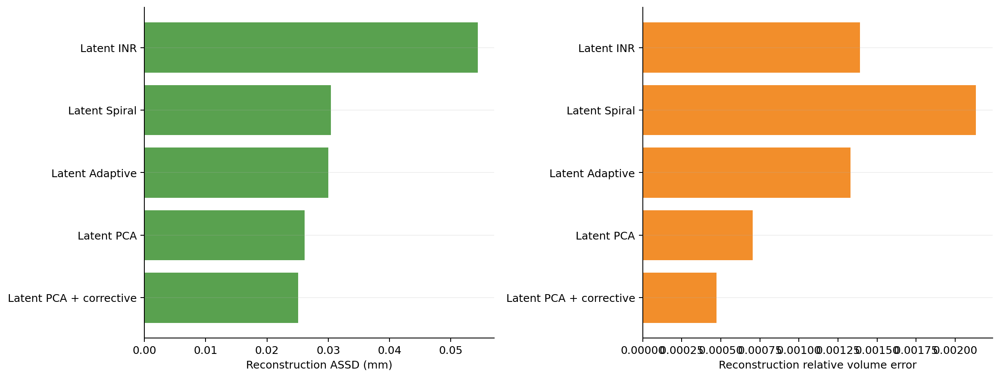

In [3]:
figure("representation_reconstruction_floor.png")


## 2. INR representation comparison

This is the only section that compares the two INR representation sizes. It uses the same **100 validation scans for each representation: 68 CN and 32 AD scans**. Each scan is independently reconstructed, giving 100 INR-128 reconstructions and 100 INR-256 reconstructions against the same 100 observed surfaces. It is not a temporal-flow comparison: the larger INR has the trained cocycle used elsewhere, while the smaller INR does not have a matched trained flow. F-score at 0.5 mm, surface-normal cosine, ASSD, HD95, and volume error are saved in the accompanying table. The next cell displays CN, AD, and overall summaries, not 300 different scans—the overall row re-aggregates the same 100 cases.


In [4]:
table("inr_128_vs_256_reconstruction.csv")


,representation,representation_label,split,diagnosis,scans,assd_mm,hd95_mm,chamfer_l1_mm,volume_relative_error,normal_signed_cosine,fscore_0_5mm
0,inr_128,INR-128,val,CN,68,0.098461,0.281688,0.196922,0.007592,0.959921,0.994261
1,inr_128,INR-128,val,AD,32,0.113905,0.327814,0.227809,0.008821,0.947024,0.987837
2,inr_128,INR-128,val,overall,100,0.103403,0.296448,0.206806,0.007985,0.955794,0.992205
3,inr_256,INR-256,val,CN,68,0.050629,0.146168,0.101257,0.001414,0.967901,0.999690
4,inr_256,INR-256,val,AD,32,0.060635,0.178641,0.121270,0.001495,0.957973,0.998952
5,inr_256,INR-256,val,overall,100,0.053831,0.156560,0.107661,0.001440,0.964724,0.999454


,representation,representation_label,split,diagnosis,scans,assd_mm,hd95_mm,chamfer_l1_mm,volume_relative_error,normal_signed_cosine,fscore_0_5mm
0,inr_128,INR-128,val,CN,68,0.098461,0.281688,0.196922,0.007592,0.959921,0.994261
1,inr_128,INR-128,val,AD,32,0.113905,0.327814,0.227809,0.008821,0.947024,0.987837
2,inr_128,INR-128,val,overall,100,0.103403,0.296448,0.206806,0.007985,0.955794,0.992205
3,inr_256,INR-256,val,CN,68,0.050629,0.146168,0.101257,0.001414,0.967901,0.999690
4,inr_256,INR-256,val,AD,32,0.060635,0.178641,0.121270,0.001495,0.957973,0.998952
5,inr_256,INR-256,val,overall,100,0.053831,0.156560,0.107661,0.001440,0.964724,0.999454


The figure converts the overall rows of the preceding table into side-by-side metric bars. Lower ASSD/HD95/volume error is better; higher F-score and normal cosine are better. Every plotted INR-128 value and INR-256 value comes from the same 100 validation surfaces. This plot must not be read as evidence that the same ranking would hold after temporal transport.


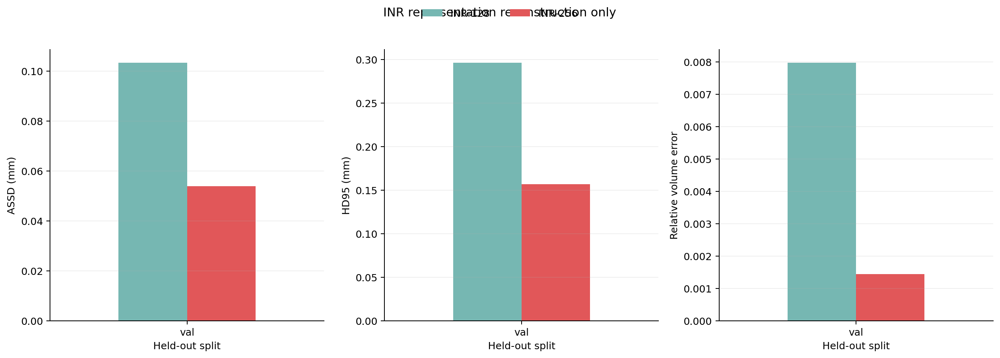

In [5]:
figure("inr_128_vs_256_reconstruction.png")


## 3. Future-shape endpoint accuracy

For each of **20 held-out test subjects (13 CN, 7 AD)**, each method receives the first observed surface at age `s` and predicts one surface at that same subject's last observed age `t`. The predicted surface is compared with the subject's actual last scan, so every method contributes **20 predictions against 20 observed target surfaces**. No intermediate test scan is used to choose a model.

ASSD and HD95 use sampled physical surfaces and are valid when sampled metrics are available. Mean corresponding-vertex distance is `mean_i ||X_pred,i - X_GT,i||_2` in millimetres at homologous vertices. ASSD is the average of predicted-to-observed and observed-to-predicted nearest-surface distances; HD95 is the 95th percentile of those distances. Chamfer-L1 is twice ASSD under the symmetric definition used here. Volume-relative error is `|V_pred - V_GT| / V_GT`.

The earlier fixed/implicit comparisons used 30,000 sampled points; the centralized direct/LAMM and PCA ODE evaluations used 10,000. Every row records this. Rankings should emphasize effect sizes and paired subject results rather than tiny sampling-level differences.

The next cell displays the overall 20-subject summary for each retained method. CN/AD subgroup rows remain in the file but are not duplicated in this compact table. Only LAMM N3 is displayed.


In [6]:
endpoint = table(
    "prediction_metrics_strict_test.csv",
    ["method_label", "model_family", "diagnosis", "subjects", "surface_samples", "mean_vertex_error_mm", "assd_mm", "hd95_mm", "volume_relative_error", "normal_signed_cosine", "flipped_face_fraction"],
    'diagnosis == "overall" and method not in @NONSELECTED_LAMM',
)


,method_label,model_family,diagnosis,subjects,surface_samples,mean_vertex_error_mm,assd_mm,hd95_mm,volume_relative_error,normal_signed_cosine,flipped_face_fraction
0,Latent PCA,fixed-topology latent cocycle,overall,20,30000.0,0.306314,0.203187,0.514887,0.036528,0.956257,0.0
1,Latent Spiral,fixed-topology latent cocycle,overall,20,30000.0,0.305809,0.202368,0.514175,0.036089,0.956013,0.0
2,Latent Adaptive,fixed-topology latent cocycle,overall,20,30000.0,0.304591,0.202201,0.517973,0.036146,0.956452,0.0
3,Latent PCA + corrective,fixed-topology latent cocycle,overall,20,30000.0,0.304837,0.202769,0.515567,0.036565,0.956459,0.0
4,Latent INR,implicit latent cocycle,overall,20,30000.0,NaN,0.215756,0.555586,0.031816,NaN,NaN
5,Latent LAMM N3 ensemble,latent cocycle ensemble,overall,20,NaN,0.302867,NaN,NaN,0.035383,NaN,NaN
6,Direct Adaptive,direct mesh cocycle,overall,20,10000.0,0.299641,0.198591,0.505942,0.028454,0.956833,0.0
7,Direct Spiral,direct mesh cocycle,overall,20,10000.0,0.299295,0.198452,0.506291,0.028495,0.956862,0.0
8,PCA BrainODE,matched PCA ODE baseline,overall,20,10000.0,0.318376,0.210673,0.529242,0.039613,0.955569,0.0
9,PCA plain ODE,matched PCA ODE baseline,overall,20,10000.0,0.313006,0.207487,0.530419,0.043522,0.956237,0.0


The four panels below use the same 20 predicted/observed endpoint pairs per method. Each horizontal bar is the method's mean across those 20 subjects: ASSD summarizes typical surface mismatch, HD95 highlights localized failures, corresponding-vertex distance uses anatomical correspondence, and volume error tests global atrophy magnitude. Lower is better. A missing bar means that metric was not validly cached for that representation; it does not mean zero error. No single panel is the complete answer.


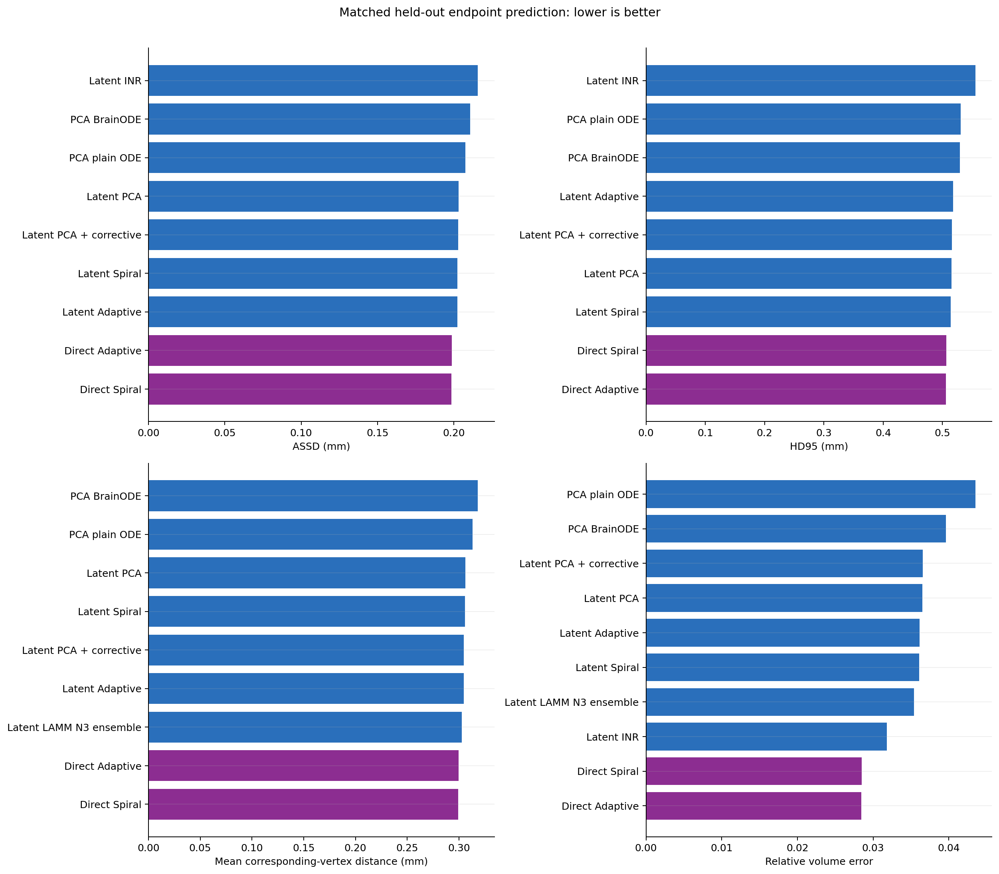

In [7]:
figure("prediction_metrics_strict_test.png")


### Companion view without Direct Spiral or Direct Adaptive

This companion repeats the identical 20-subject endpoint comparison and the same four metrics, but removes the two direct-mesh rows before plotting. No values are recomputed, rescaled, or re-ranked. It provides an uncluttered comparison among the latent representations and the matched ODE baselines while the original all-method figure remains above.


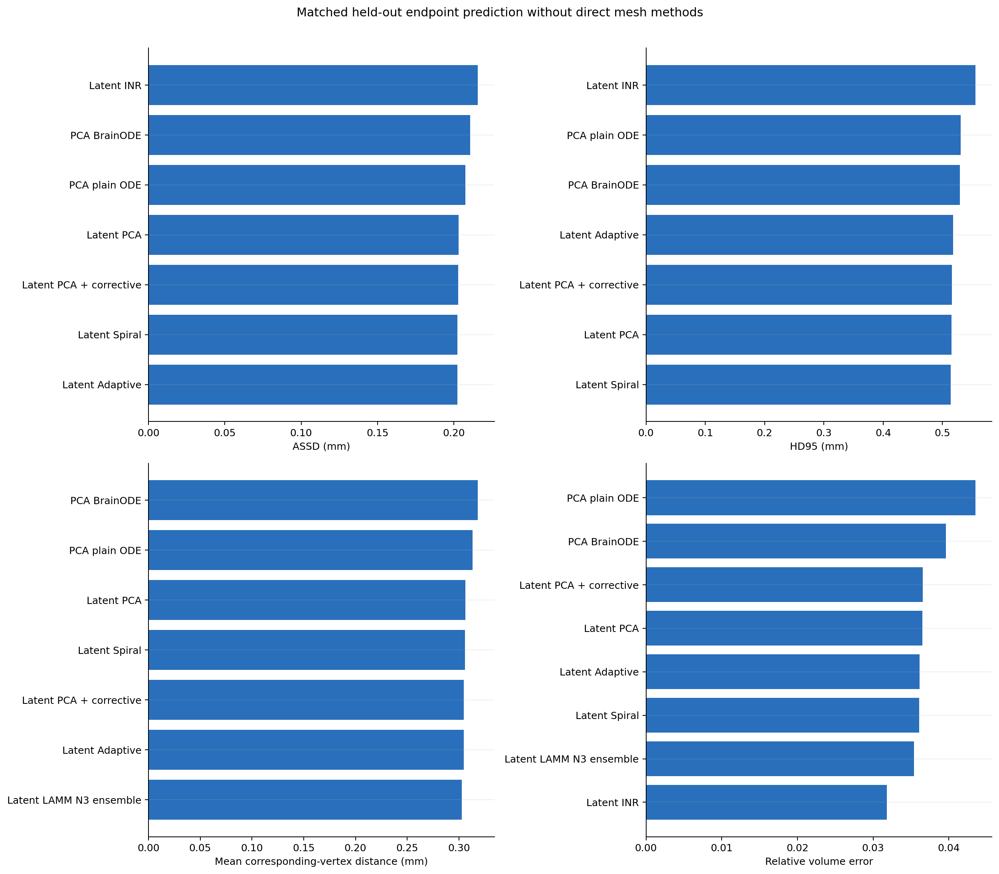

In [8]:
figure("prediction_metrics_strict_test_without_direct_mesh.png")


For each of the same 20 subjects, the unchanged-source baseline uses `X_pred = X_source` at the target age. The plotted value is `model endpoint error / unchanged-source endpoint error`, calculated with the corresponding metric before cohort aggregation. A ratio below 1 means that temporal prediction improves on reusing the source; above 1 means it is worse. The reference contains 20 unchanged-source comparisons against the same 20 observed target scans, making this a paired baseline rather than a different cohort.


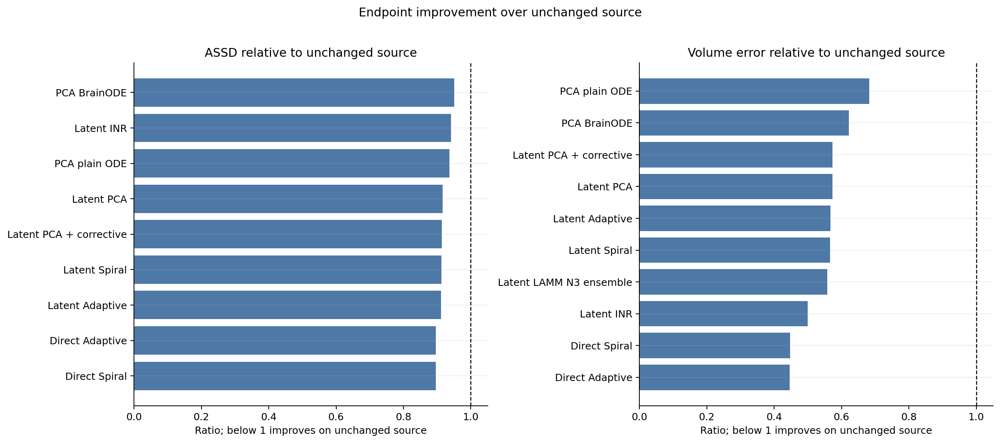

In [9]:
figure("prediction_vs_nochange.png")


### Companion unchanged-source comparison without direct mesh methods

This figure uses the same 20 paired test intervals and the same unchanged-source denominators as the original. Direct Spiral and Direct Adaptive are filtered only at display time; the remaining ratios are numerically identical to those above, and values below one retain the same interpretation.


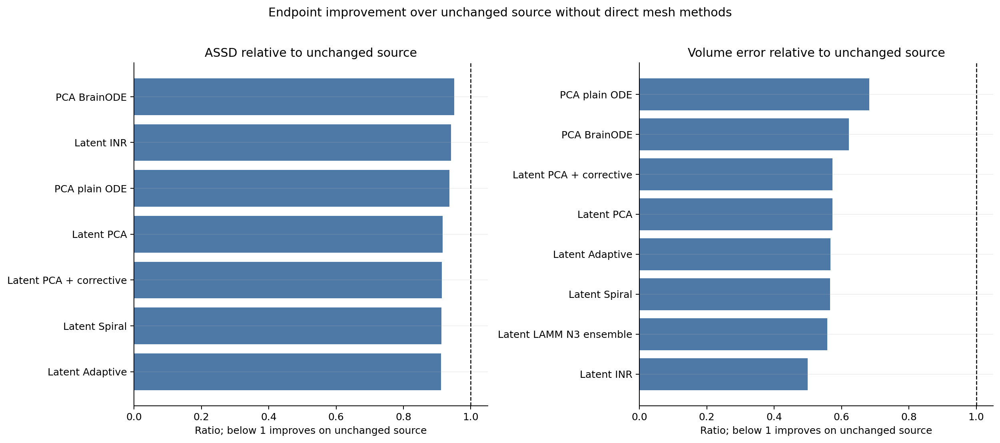

In [10]:
figure("prediction_vs_nochange_without_direct_mesh.png")


## 4. Validation-only best-method choice

The interactive extrapolation cannot be chosen using the test set. Candidates first pass a structural gate (finite output and negligible face flips). The selection score then gives equal importance to the rank of macro-average validation ASSD and macro-average absolute log-volume-rate error across CN and AD. Velocity is reported independently and is not used to hide a surface/volume trade-off.

The saved selection file originally evaluated five direct-mesh candidates on validation data: Direct Spiral, Direct Adaptive, and three direct LAMM ablations. To keep this report focused, the cell displays the non-LAMM rows and the selected result, while the selection decision itself remains unchanged and auditable in the CSV. The displayed score is `rank(ASSD) + rank(volume-rate MAE)`; lower is better. No test endpoint contributes to this choice.


In [11]:
ranking = pd.read_csv(TABLES / "validation_best_method_ranking.csv")
display(ranking.loc[~ranking.method.astype(str).isin(NONSELECTED_LAMM)].reset_index(drop=True))
selected = ranking.loc[ranking.selected_for_ood.astype(bool), ["method_label", "validation_macro_assd_mm", "validation_macro_volume_rate_mae_per_year", "validation_macro_velocity_normal_rmse_mm_per_year", "relative_cocycle_defect_mean"]]
display(HTML("<b>Validation-selected method for the OOD visualization:</b> " + selected.method_label.iloc[0]))


,method,method_label,validation_macro_assd_mm,validation_macro_volume_rate_mae_per_year,validation_macro_velocity_normal_rmse_mm_per_year,maximum_flipped_face_fraction,relative_cocycle_defect_mean,structural_gate_pass,surface_rank,volume_rank,selection_rank_sum,selected_for_ood
0,adaptive_spiral_mesh_direct,Direct Adaptive,0.217241,0.012778,0.104905,0.0,0.002211,True,1.0,2.0,3.0,True
1,spiral_mesh_direct,Direct Spiral,0.217353,0.012664,0.104906,0.0,0.003428,True,2.0,1.0,3.0,False


## 5. AD and CN volume trends

The volume analysis uses the same **20 strict test subjects and 20 first-to-last intervals** as endpoint accuracy: 13 CN and 7 AD. Each method therefore contributes 13 CN predictions and 7 AD predictions, each compared with the corresponding observed last scan.

For subject `j`, the signed log-volume rate is `r_j = log(V_target,j / V_source,j) / (t_j-s_j)`. Multiplying by 100 gives an approximately interpretable percent change per year. Negative values indicate volume loss. `V_target` is the actual repeat-scan volume for the observed rate and the predicted future-mesh volume for the model rate. The next cell displays method-by-diagnosis means and errors; only LAMM N3 is retained.


In [12]:
volume_rates = pd.read_csv(TABLES / "volume_rate_ad_cn.csv")
display(volume_rates.loc[~volume_rates.method.astype(str).isin(NONSELECTED_LAMM)].reset_index(drop=True))


,method,method_label,diagnosis,subjects,observed_log_volume_rate_per_year,predicted_log_volume_rate_per_year,volume_rate_abs_error_per_year,volume_relative_error
0,pca128,Latent PCA,CN,13,-0.012099,-0.011088,0.009229,0.032122
1,pca128,Latent PCA,AD,7,-0.047842,-0.054593,0.024499,0.044709
2,spiralnet128,Latent Spiral,CN,13,-0.012099,-0.012294,0.009526,0.031145
3,spiralnet128,Latent Spiral,AD,7,-0.047842,-0.054112,0.023853,0.045272
4,adaptive128,Latent Adaptive,CN,13,-0.012099,-0.011583,0.010203,0.033036
5,adaptive128,Latent Adaptive,AD,7,-0.047842,-0.052309,0.022533,0.041922
6,pca_corrective128,Latent PCA + corrective,CN,13,-0.012099,-0.013076,0.009602,0.032316
7,pca_corrective128,Latent PCA + corrective,AD,7,-0.047842,-0.050881,0.023552,0.044457
8,inr256,Latent INR,CN,13,-0.012099,-0.005474,0.009626,0.032469
9,inr256,Latent INR,AD,7,-0.047842,-0.034607,0.017169,0.030603


For each method and diagnosis, the plot places the mean observed rate and mean predicted rate side by side. Each CN bar summarizes 13 paired intervals; each AD bar summarizes 7. These are group means, not age-wise trajectories. AD–CN separation should be judged together with subject-level absolute error because agreement in sign alone is insufficient and the AD group is smaller.


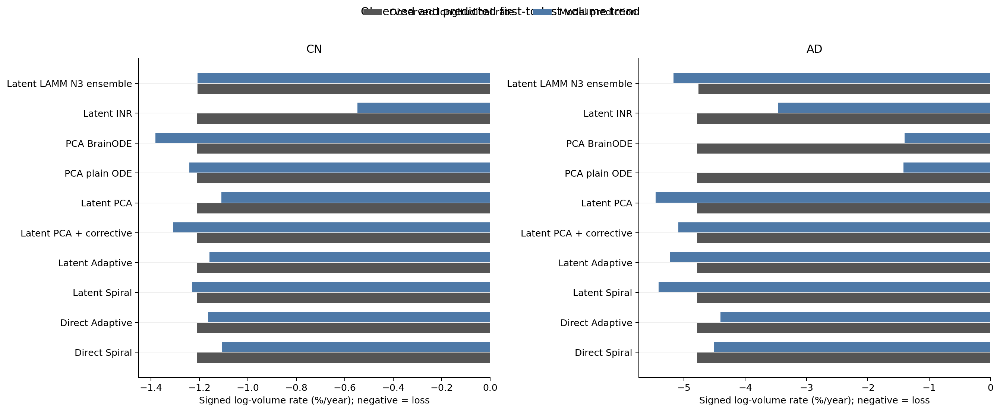

In [13]:
figure("volume_rate_ad_cn.png")


### Companion AD/CN volume plot without direct mesh methods

This companion retains the same 13 CN and 7 AD observed intervals and the same predicted volumes, but omits Direct Spiral and Direct Adaptive from the displayed method list. Observed bars are repeated for each retained method solely to keep every prediction beside its matched cohort reference.


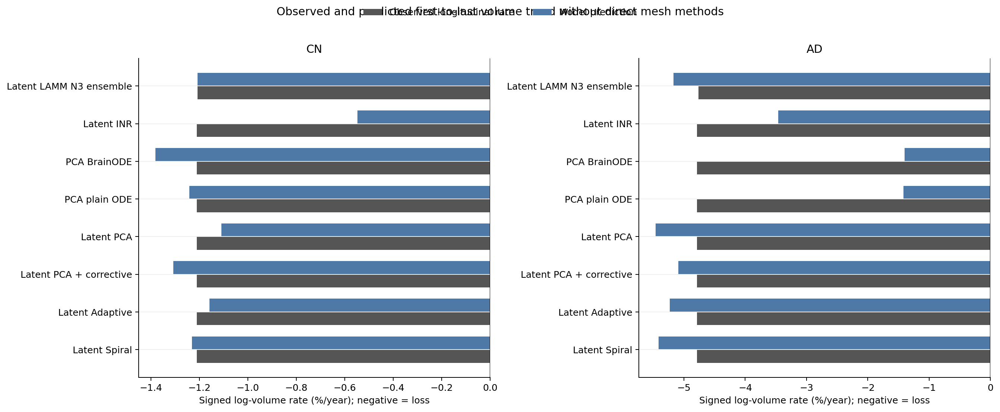

In [14]:
figure("volume_rate_ad_cn_without_direct_mesh.png")


## 6. Instantaneous surface progression

### 6.0 From a latent cocycle derivative to millimetres/year on the surface

Let `X_s` be the corresponding-vertex surface at source age `s`, `E` the frozen encoder, and `D` the frozen decoder. A latent cocycle predicts

`z_s = E(X_s)`, and `z_u = Phi_z(z_s, s, u, d)`,

where `u` is target age and `d` is the CN/AD condition. The cocycle identities are `Phi_z(z,t,t,d)=z` and `Phi_z(Phi_z(z,s,m,d),m,u,d)=Phi_z(z,s,u,d)`.

The value on the diagonal is the unchanged state, not velocity. Instantaneous latent velocity is the target-age derivative on that diagonal:

`v_z(t,d) = partial Phi_z(z_t,t,u,d) / partial u, evaluated at u=t`.

For the trained residual parameterization `Phi_z(z,s,u,d)=z+(u-s) U_z(z,s,u,d)`, this derivative is exactly `U_z(z,t,t,d)`. The network was trained with normalized age `tau = a * age_years + b`, so the code first converts to per-year units:

`v_z_per_year = a * partial Phi_z / partial tau_u`.

Latent coordinates do not have physical millimetre units. The decoded trajectory is `X(u)=D(z(u))`; applying the chain rule gives the surface field

`v_X = J_D(z_t) v_z_per_year`,

where `J_D` is the decoder Jacobian. The implementation computes this Jacobian-vector product directly with automatic differentiation; it does not form the full Jacobian and does not estimate it with noisy finite differences. For linear PCA decoding this reduces to multiplication by the PCA basis. For Spiral, Adaptive, and each LAMM member it differentiates the trained nonlinear decoder. The three LAMM N3 surface fields are averaged after decoding, producing one reported ensemble field.

Direct-mesh cocycles operate on `X` itself, so `partial Phi_X / partial u` is already a per-vertex mm/year field. Plain ODE and BrainODE provide a latent vector field `f(z,t,d)`; that field is mapped through the same PCA decoder Jacobian, allowing all methods to be compared in physical surface space.

Before measuring biological shape change, the best infinitesimal rigid translation and rotation are removed. At vertex `i` with outward unit normal `n_i`, reported inward velocity is

`q_i = - n_i dot v_X,i`.

Thus positive values mean contraction and negative values mean outward expansion.

### What “observed” means here

There is no continuously measured instantaneous ground truth. For each subject with repeated scans, all corresponding surfaces are first generalized-rigid aligned. A first-order surface trajectory is then fitted by least squares across that subject's actual visit ages, separately for every vertex coordinate. Its derivative is the **observed fitted change**. It is a repeat-scan estimate and is therefore shown as “observed,” not as exact continuous-time truth. Section 6.3 separately uses actual baseline-to-follow-up displacement without differentiating a fitted curve.

All detailed velocity analyses use the same **61 validation subjects and 269 scans: 33 CN subjects/172 scans and 28 AD subjects/97 scans**. Every one of the eight detailed methods produces 269 predicted surface-velocity fields, each compared with the corresponding fitted observed field. Visits are averaged within subject first and subjects are then averaged equally. The next table shows the whole-surface subject-balanced summary; its “overall” row uses all 61 subjects and does not count 269 scans as independent subjects.


In [15]:
table(
    "matched_velocity_summary.csv",
    ["method_label", "diagnosis", "subjects", "predicted_inward_normal_mm_per_year", "observed_inward_normal_mm_per_year", "normal_rmse_mm_per_year", "zero_normal_rmse_mm_per_year", "normal_error_to_zero_ratio"],
    'diagnosis == "overall"',
)


,method_label,diagnosis,subjects,predicted_inward_normal_mm_per_year,observed_inward_normal_mm_per_year,normal_rmse_mm_per_year,zero_normal_rmse_mm_per_year,normal_error_to_zero_ratio
0,Latent LAMM N3 ensemble,overall,61,0.045327,0.049305,0.136756,0.150666,0.907679
1,Latent Adaptive,overall,61,0.045646,0.049305,0.136623,0.150666,0.906795
2,Latent PCA,overall,61,0.046739,0.049305,0.137314,0.150666,0.911381
3,Latent Spiral,overall,61,0.046690,0.049305,0.136935,0.150666,0.908863
4,Direct Adaptive,overall,61,0.046468,0.049305,0.135897,0.150666,0.901974
5,Direct Spiral,overall,61,0.047679,0.049305,0.135938,0.150666,0.902249
6,PCA BrainODE,overall,61,0.025738,0.049305,0.141994,0.150666,0.942444
7,PCA plain ODE,overall,61,0.024972,0.049305,0.142785,0.150666,0.947690


,method_label,diagnosis,subjects,predicted_inward_normal_mm_per_year,observed_inward_normal_mm_per_year,normal_rmse_mm_per_year,zero_normal_rmse_mm_per_year,normal_error_to_zero_ratio
16,Latent LAMM N3 ensemble,overall,61,0.045327,0.049305,0.136756,0.150666,0.907679
17,Latent Adaptive,overall,61,0.045646,0.049305,0.136623,0.150666,0.906795
18,Latent PCA,overall,61,0.046739,0.049305,0.137314,0.150666,0.911381
19,Latent Spiral,overall,61,0.046690,0.049305,0.136935,0.150666,0.908863
20,Direct Adaptive,overall,61,0.046468,0.049305,0.135897,0.150666,0.901974
21,Direct Spiral,overall,61,0.047679,0.049305,0.135938,0.150666,0.902249
22,PCA BrainODE,overall,61,0.025738,0.049305,0.141994,0.150666,0.942444
23,PCA plain ODE,overall,61,0.024972,0.049305,0.142785,0.150666,0.947690


### 6.1 Matched overall agreement and CN–AD separation

The left panel begins with vertex-wise normal RMSE between each of the 269 predicted and fitted-observed fields. Scan errors are averaged within each of 61 subjects and then across subjects. It divides model RMSE by the RMSE obtained from predicting zero velocity; values below 1 improve on no change.

The right panel has one CN and one AD **predicted bar** per method. Each CN bar is the equal-subject mean for 33 CN subjects; each AD bar is the equal-subject mean for 28 AD subjects. Blue and orange dashed horizontal lines are the corresponding observed fitted means computed from the same 172 CN and 97 AD scans. Total vector speed is not the main measure because it counts tangential correspondence motion as biological change.


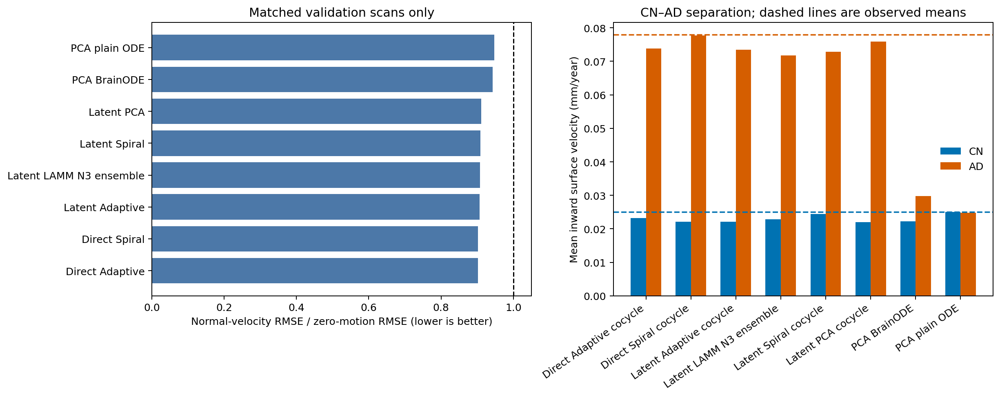

In [16]:
figure("velocity_matched_cohort_summary.png")


### Companion matched-velocity summary without direct mesh methods

This companion uses the identical 61 subjects, 269 predicted/fitted-observed field pairs per method, subject-equal aggregation, and zero-motion denominator. Only Direct Spiral and Direct Adaptive are removed from the plotted rows; the six remaining methods keep exactly the values shown in the original figure.


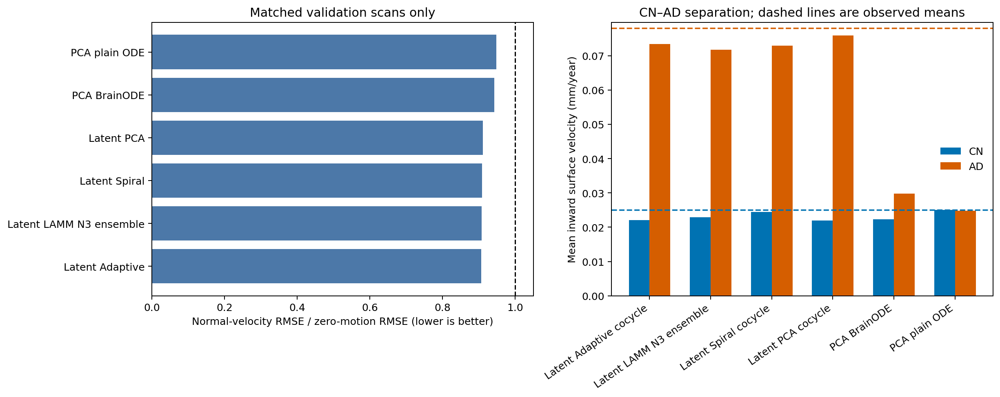

In [17]:
figure("velocity_matched_cohort_summary_without_direct_mesh.png")


### 6.2 Where does the surface move inward?

The mean template is projected onto its principal long axis and divided by coordinate quantiles into three equal vertex sets. The wider end is labelled **head-side** and the narrower end **tail-side**; these are geometry-defined regions, not histological hippocampal subfields. Within region `R`, the scan-level value is `mean over i in R of (-n_i dot v_i)`. Rigid translation and rotation are removed first.

For every method, the table is derived from **269 predicted fields and 269 fitted-observed fields**. It contains 33-subject CN means and 28-subject AD means for the three regions; repeat visits are averaged within subject before the group mean. `normal_error_to_zero_ratio` below 1 means the regional field is closer to fitted longitudinal change than zero motion. The cell displays 8 methods × 2 diagnoses × 3 regions = 48 rows.


In [18]:
table(
    "regional_surface_velocity_summary.csv",
    ["method_label", "diagnosis", "region", "subjects", "predicted_inward_mm_per_year", "observed_inward_mm_per_year", "predicted_radial_narrowing_mm_per_year", "predicted_area_change_percent_per_year", "normal_error_to_zero_ratio"],
    'region != "Whole surface"',
)


,method_label,diagnosis,region,subjects,predicted_inward_mm_per_year,observed_inward_mm_per_year,predicted_radial_narrowing_mm_per_year,predicted_area_change_percent_per_year,normal_error_to_zero_ratio
0,Latent LAMM N3 ensemble,AD,Head-side third,28,0.086638,0.077536,0.078973,-2.170418,0.875942
1,Latent LAMM N3 ensemble,AD,Middle third,28,0.071407,0.083543,0.086171,-1.467322,0.913715
2,Latent LAMM N3 ensemble,AD,Tail-side third,28,0.056910,0.072817,0.071180,-2.051655,0.897088
3,Latent LAMM N3 ensemble,CN,Head-side third,33,0.026811,0.028151,0.027092,-0.699823,0.937908
4,Latent LAMM N3 ensemble,CN,Middle third,33,0.021429,0.028545,0.027604,-0.453980,0.926639
5,Latent LAMM N3 ensemble,CN,Tail-side third,33,0.019908,0.018262,0.026420,-0.735508,0.918988
6,Latent Adaptive cocycle,AD,Head-side third,28,0.087601,0.077536,0.080192,-2.205536,0.882473
7,Latent Adaptive cocycle,AD,Middle third,28,0.073108,0.083543,0.088152,-1.502774,0.906917
8,Latent Adaptive cocycle,AD,Tail-side third,28,0.059118,0.072817,0.074213,-2.129822,0.895001
9,Latent Adaptive cocycle,CN,Head-side third,33,0.025952,0.028151,0.025971,-0.678052,0.936418


,method_label,diagnosis,region,subjects,predicted_inward_mm_per_year,observed_inward_mm_per_year,predicted_radial_narrowing_mm_per_year,predicted_area_change_percent_per_year,normal_error_to_zero_ratio
0,Latent LAMM N3 ensemble,AD,Head-side third,28,0.086638,0.077536,0.078973,-2.170418,0.875942
1,Latent LAMM N3 ensemble,AD,Middle third,28,0.071407,0.083543,0.086171,-1.467322,0.913715
2,Latent LAMM N3 ensemble,AD,Tail-side third,28,0.056910,0.072817,0.071180,-2.051655,0.897088
4,Latent LAMM N3 ensemble,CN,Head-side third,33,0.026811,0.028151,0.027092,-0.699823,0.937908
5,Latent LAMM N3 ensemble,CN,Middle third,33,0.021429,0.028545,0.027604,-0.453980,0.926639
6,Latent LAMM N3 ensemble,CN,Tail-side third,33,0.019908,0.018262,0.026420,-0.735508,0.918988
8,Latent Adaptive cocycle,AD,Head-side third,28,0.087601,0.077536,0.080192,-2.205536,0.882473
9,Latent Adaptive cocycle,AD,Middle third,28,0.073108,0.083543,0.088152,-1.502774,0.906917
10,Latent Adaptive cocycle,AD,Tail-side third,28,0.059118,0.072817,0.074213,-2.129822,0.895001
12,Latent Adaptive cocycle,CN,Head-side third,33,0.025952,0.028151,0.025971,-0.678052,0.936418


Each colored dot is the predicted subject-balanced regional mean from the preceding table. Colored line segments only connect the three categorical regions to make their spatial pattern readable; they are not an anatomical interpolation. The black dashed diamonds are fitted-observed regional means from the same subjects and scans. The left panel uses 33 CN subjects/172 scans; the right uses 28 AD subjects/97 scans. Agreement requires both magnitude and head-to-tail pattern to match the black curve.


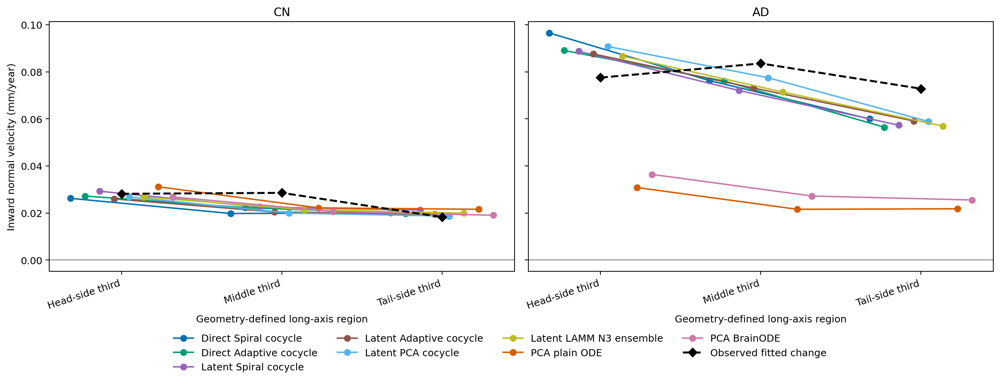

In [19]:
figure("velocity_regional_inward.png")


### Companion regional velocity plot without direct mesh methods

This figure repeats the same head-, middle-, and tail-side subject-balanced means from 33 CN and 28 AD subjects. It omits the two direct-mesh curves, leaving latent Spiral, latent Adaptive, latent PCA, LAMM N3, Plain ODE, BrainODE, and the unchanged black fitted-observed reference.


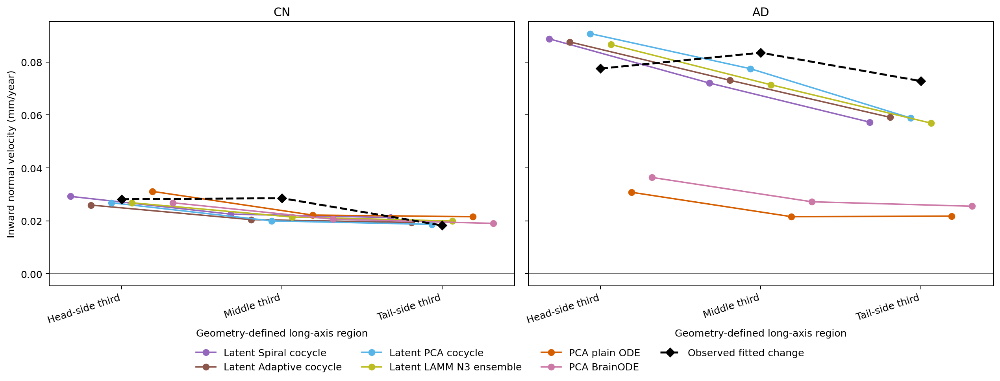

In [20]:
figure("velocity_regional_inward_without_direct_mesh.png")


### 6.3 Does diagonal velocity accumulate to actual inter-visit change?

The validation sequences provide **208 observed baseline-to-later-visit intervals from 61 subjects: 139 CN and 69 AD intervals**. Each method predicts all 208 endpoints. For interval `[s,t]`, its diagonal field is evaluated on the model's evolving predicted shape at seven equally spaced ages `u_k`. Trapezoidal integration estimates

`Delta X_diag = integral from s to t of v_X(Phi(X_s,s,u,d),u,d) du`.

After rigid alignment, its mean inward rate is compared with `-mean_i n_i dot (X_GT,t,i - X_s,i)/(t-s)`, calculated from the actual observed follow-up mesh. There are 7 × 208 = **1,456 diagonal evaluations per method**. This evaluates the cocycle field without retraining it or converting the architecture into an ODE.

The left bar for each method is subject-level integrated-rate RMSE divided by subject-level zero-motion RMSE. The right scatter first averages multiple intervals within subject, then plots predicted integrated rate against actual interval rate: **61 points per method**. The diagonal line is equality. Unlike the crosses in Section 6.5, the horizontal coordinate here comes directly from observed scan-to-scan displacement rather than a fitted instantaneous derivative.


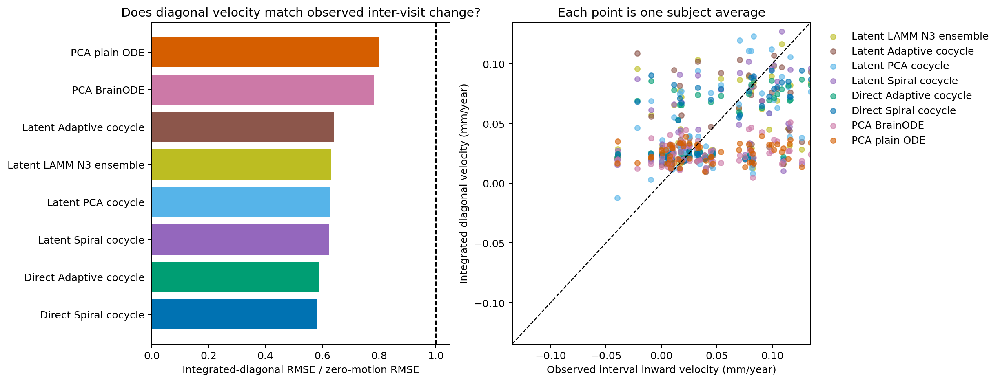

In [21]:
figure("velocity_interval_integrated.png")


### Companion integrated-diagonal comparison without direct mesh methods

The companion uses all 208 observed intervals and all seven diagonal evaluations per interval exactly as above. Direct Spiral and Direct Adaptive are excluded after the error ratios and subject-level points are calculated, so axes, equality reference, physical units, and biological interpretation remain unchanged.


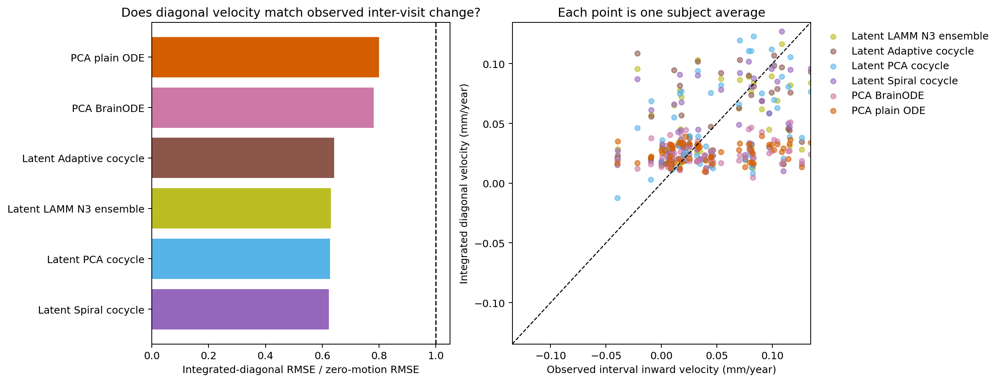

In [22]:
figure("velocity_interval_integrated_without_direct_mesh.png")


The accompanying table starts from all 208 intervals per method and reports diagnosis means for the whole surface. It distinguishes actual observed interval rate, seven-point integrated diagonal rate, and rate implied by the model's directly predicted endpoint. The absolute difference between the last two is the **diagonal-to-endpoint closure error**. The displayed means summarize 139 CN or 69 AD intervals; the raw CSV retains interval and subject identifiers.


In [23]:
interval = pd.read_csv(TABLES / "interval_integrated_velocity.csv")
display(
    interval.query('region == "Whole surface"')
    .groupby(["method_label", "diagnosis"], as_index=False)[
        ["observed_interval_inward_mm_per_year", "integrated_diagonal_inward_mm_per_year", "endpoint_inward_mm_per_year", "integrated_abs_error_mm_per_year", "diagonal_endpoint_closure_abs_mm_per_year"]
    ].mean()
)


,method_label,diagnosis,observed_interval_inward_mm_per_year,integrated_diagonal_inward_mm_per_year,endpoint_inward_mm_per_year,integrated_abs_error_mm_per_year,diagonal_endpoint_closure_abs_mm_per_year
0,Direct Adaptive cocycle,AD,0.080455,0.073912,0.073285,0.047177,0.000627
1,Direct Adaptive cocycle,CN,0.024077,0.023101,0.022910,0.024936,0.000193
2,Direct Spiral cocycle,AD,0.080455,0.077641,0.076539,0.046511,0.001103
3,Direct Spiral cocycle,CN,0.024077,0.022127,0.021717,0.024905,0.000410
4,Latent Adaptive cocycle,AD,0.080455,0.073169,0.073730,0.053825,0.003364
5,Latent Adaptive cocycle,CN,0.024077,0.021633,0.020768,0.024874,0.002111
6,Latent LAMM N3 ensemble,AD,0.080455,0.071680,0.070599,0.052027,0.002150
7,Latent LAMM N3 ensemble,CN,0.024077,0.023359,0.022529,0.024988,0.001669
8,Latent PCA cocycle,AD,0.080455,0.076272,0.075798,0.050191,0.001840
9,Latent PCA cocycle,CN,0.024077,0.022513,0.022016,0.024015,0.001068


### 6.4 Tangent consistency: a mathematical diagnostic, not biological accuracy

For each of the same 208 intervals, five interior locations from the seven-point grid are used. At each location, the surface path derivative is estimated by a centered age perturbation of 0.02 years:

`v_path approximately [Phi(X,s,u+epsilon,d) - Phi(X,s,u-epsilon,d)]/(2 epsilon)`.

After rigid-motion removal, the plot reports normal-component RMSE between `v_path` and the analytically obtained diagonal field `v_X`. This gives **1,040 comparisons per method** before subject/group aggregation. The continuous line joins the five mean path fractions; no observed scan dots appear because this is internal mathematical consistency, not biological ground truth. An ODE is expected to perform strongly because its path is defined by its vector field; biological agreement is assessed in Section 6.3.


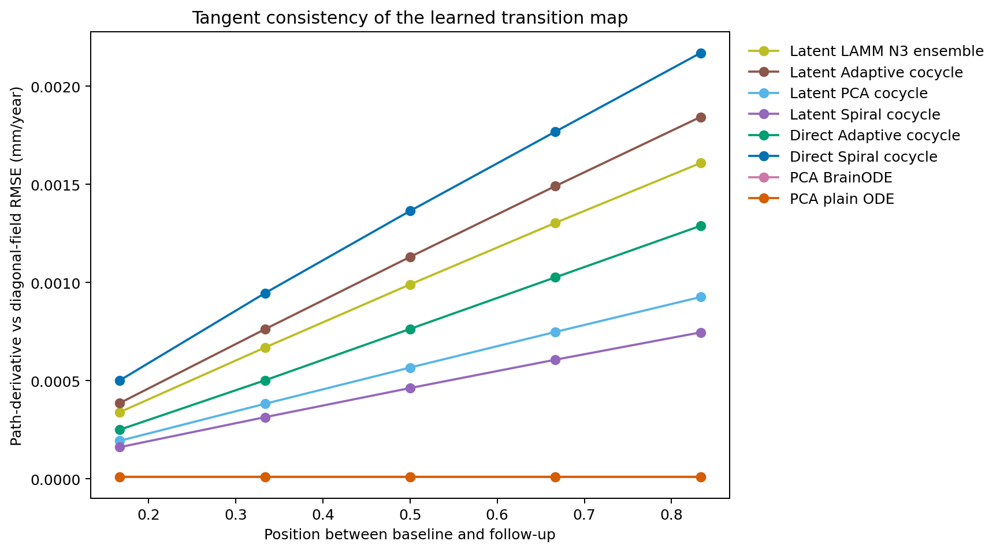

In [24]:
figure("velocity_tangent_consistency.png")


### Companion tangent-consistency plot without direct mesh methods

This version retains the same 1,040 path-location comparisons per method and displays only the three latent autoencoder families, LAMM N3, Plain ODE, and BrainODE. It remains an internal mathematical diagnostic; removing the direct methods does not turn its curves into biological ground truth.


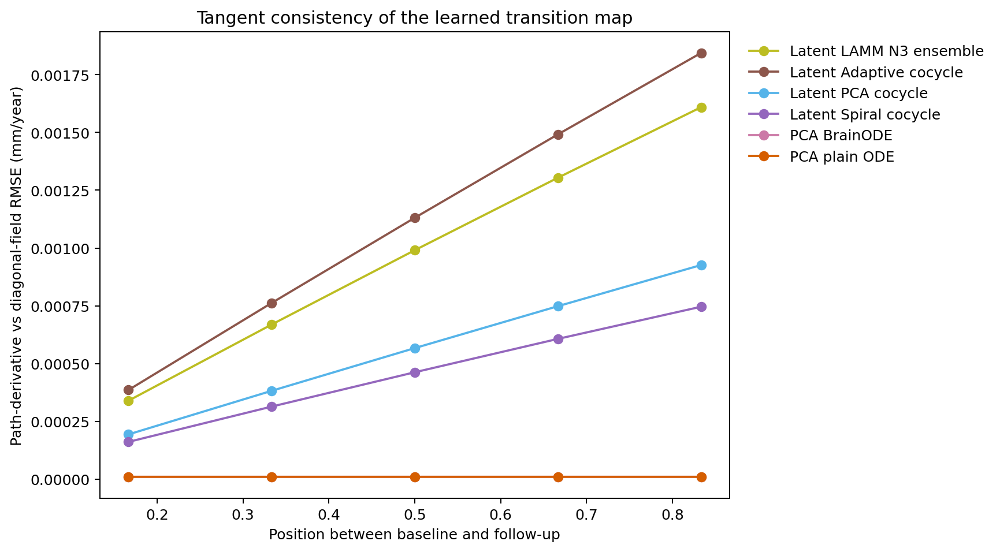

In [25]:
figure("velocity_tangent_consistency_without_direct_mesh.png")


### 6.5 Same anatomy under CN and AD conditioning

There are **51 eligible baseline surfaces** aged 70–91 that can be followed on the five-year grid without exceeding age 96; 31 originate from CN subjects and 20 from AD subjects. Regardless of original diagnosis, every baseline is transported twice—once with CN conditioning and once with AD conditioning—at 11 ages from 0 to 5 years in 0.5-year steps. This produces **51 × 2 × 11 = 1,122 predicted meshes and velocities per method**.

At each grid age, velocity is evaluated on the evolved predicted shape, not repeatedly on the unchanged baseline. A blue/orange continuous line joins the mean predictions across the same 51 starting shapes under CN/AD conditioning. The band is a 95% interval from 2,000 subject bootstrap resamples.

The crosses are derived separately from all **269 actual validation scans**. For each observed scan, the fitted subject velocity is evaluated on that scan and assigned to its actual diagnosis; elapsed time from that subject's baseline is rounded to the nearest 0.5 year and averaged within diagnosis/time bin. Thus a cross is an observed-group bin mean, not one individual scan and not the paired counterfactual of the colored line. Crosses can extend beyond five years because some actual sequences are longer than the controlled prediction horizon.

The paired AD-minus-CN difference is a model sensitivity experiment. It is not a causal claim that changing a diagnostic label would change one person's anatomy, and agreement with factual group means remains necessary.


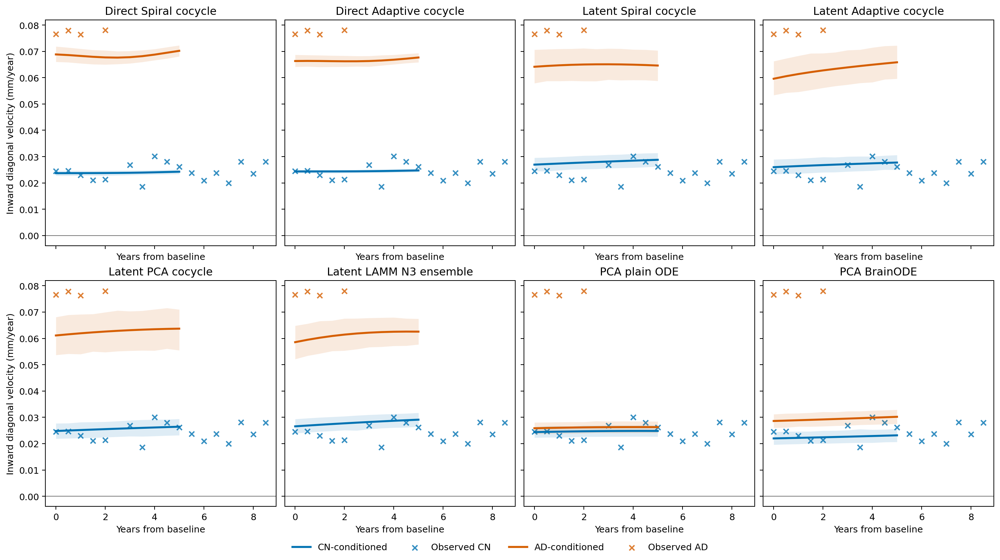

In [26]:
figure("velocity_paired_condition_trajectory.png")


### Companion diagonal-velocity trajectories without direct mesh methods

This 2-by-3 view keeps the same 51 starting surfaces, CN/AD conditioning, 11 half-year evaluations, fitted-observed crosses, and 2,000-resample confidence bands. It removes only the Direct Spiral and Direct Adaptive panels, allowing the six latent/ODE trajectories to be compared at a larger panel size.


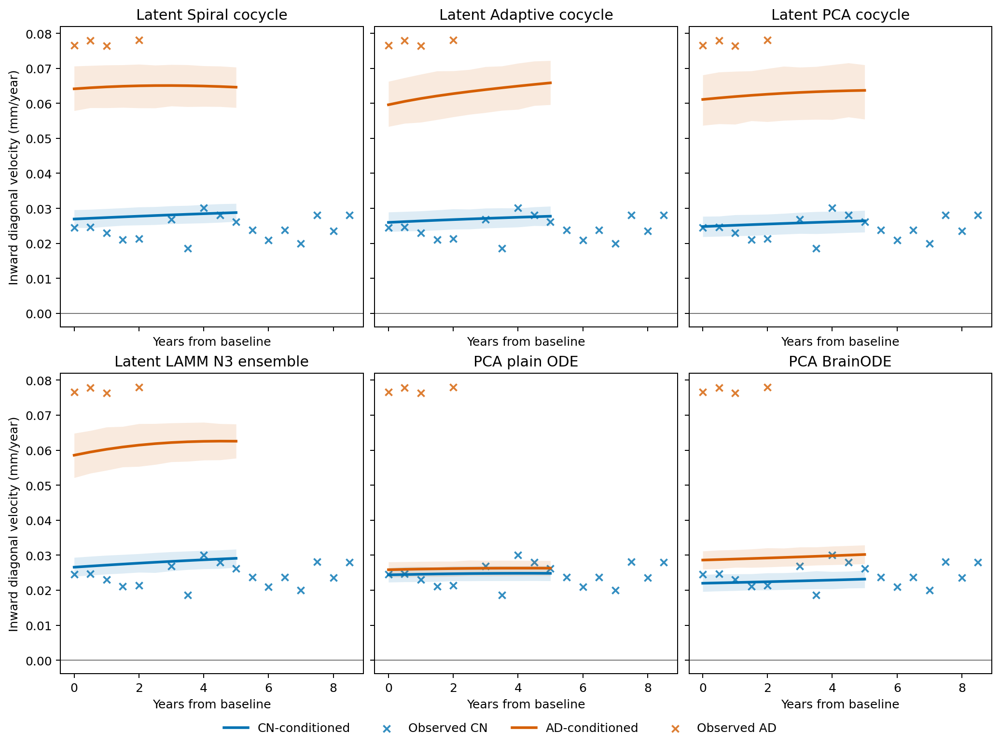

In [27]:
figure("velocity_paired_condition_trajectory_without_direct_mesh.png")


### 6.6 Surface change beyond volume

Three cumulative surface measures complement total volume:

- **Inward displacement:** corresponding vertices projected onto baseline outward normals.
- **Radial narrowing:** reduction in distance to a reproducible long-axis centreline; this is a geometric radial measure, not tissue thickness.
- **Non-uniform area change:** log surface-area change after subtracting the `2/3` scaling expected from uniform volume shrinkage. Zero means that area changed exactly as uniform rescaling predicts.

Lines are the paired CN/AD-conditioned trajectories from identical starting shapes, and shaded regions are subject-bootstrap 95% confidence intervals. Crosses are the same measurements made on actual repeated meshes. The curves are direct evaluations on a regular time grid; no post-hoc curve smoother is fitted to make them resemble the observations.

As in Section 6.5, each method contributes 1,122 predicted meshes (51 baselines × 2 conditions × 11 ages). Every line point is the mean across those 51 baselines, each band uses 2,000 subject bootstrap resamples, and observed crosses are half-year bin means from the 269 actual scans.


The first figure computes `-mean_i n_baseline,i dot (X_pred(u),i-X_baseline,i)` for every predicted mesh. A continuous colored line joins the 11 half-year cohort means in each method panel; crosses are the same calculation on actual repeat meshes grouped by elapsed-time bin. It is the cumulative surface analogue of inward instantaneous velocity.


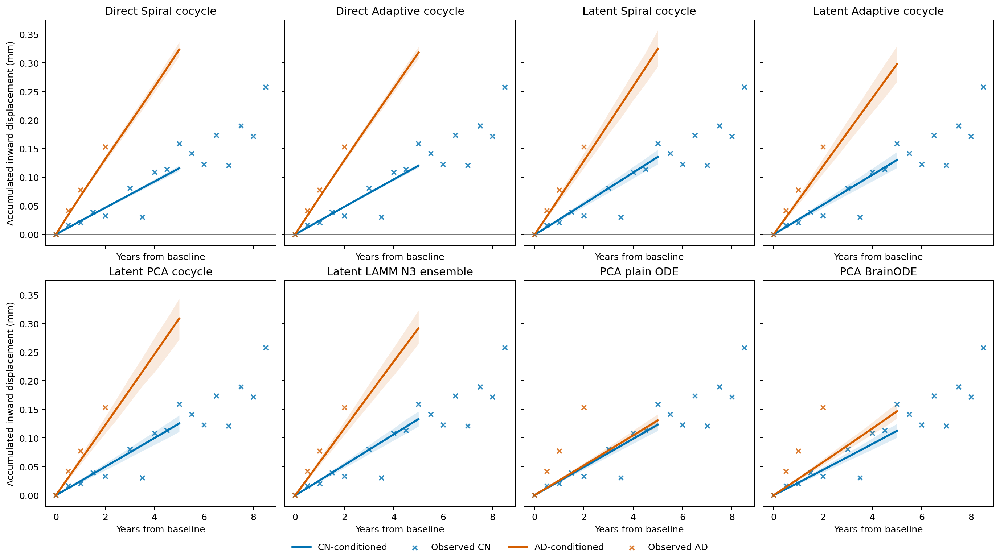

In [28]:
figure("surface_inward_displacement_progression.png")


### Companion inward-displacement trajectories without direct mesh methods

The same 1,122 predicted meshes per method and the same observed half-year bin means are shown after excluding the two direct-mesh panels. Latent and ODE values, confidence intervals, axis limits, and the definition of accumulated normal displacement are unchanged.


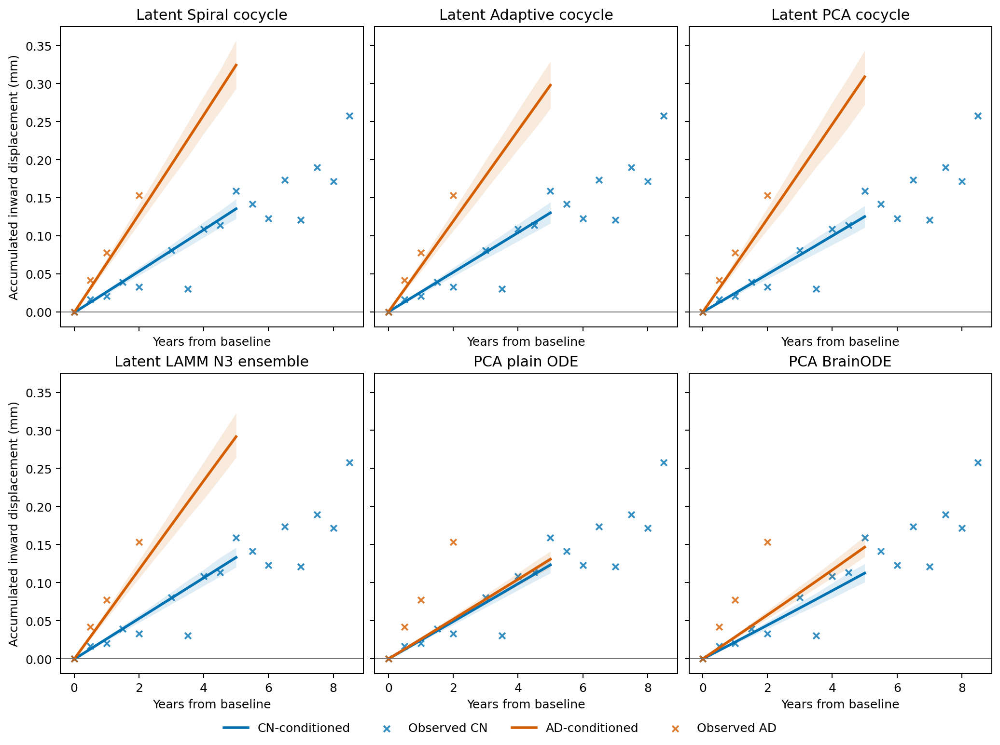

In [29]:
figure("surface_inward_displacement_progression_without_direct_mesh.png")


The second figure computes each corresponding vertex's distance to a reproducible template-derived long-axis centreline and subtracts its baseline radius. Positive narrowing is the negative mean radius change. Lines again summarize 51 paired baselines at 11 prediction ages; crosses summarize observed repeat meshes in half-year bins.


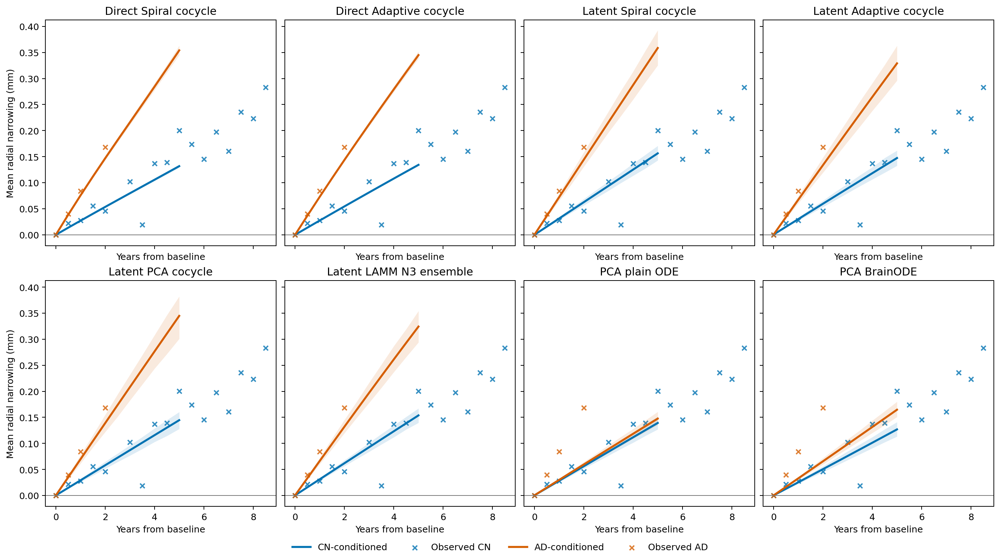

In [30]:
figure("surface_radial_narrowing_progression.png")


### Companion radial-narrowing trajectories without direct mesh methods

This 2-by-3 companion filters Direct Spiral and Direct Adaptive but otherwise uses the identical 51 paired baselines, two disease conditions, 11 ages, and observed repeat-mesh crosses. The centreline and radial-narrowing calculation are not recomputed differently.


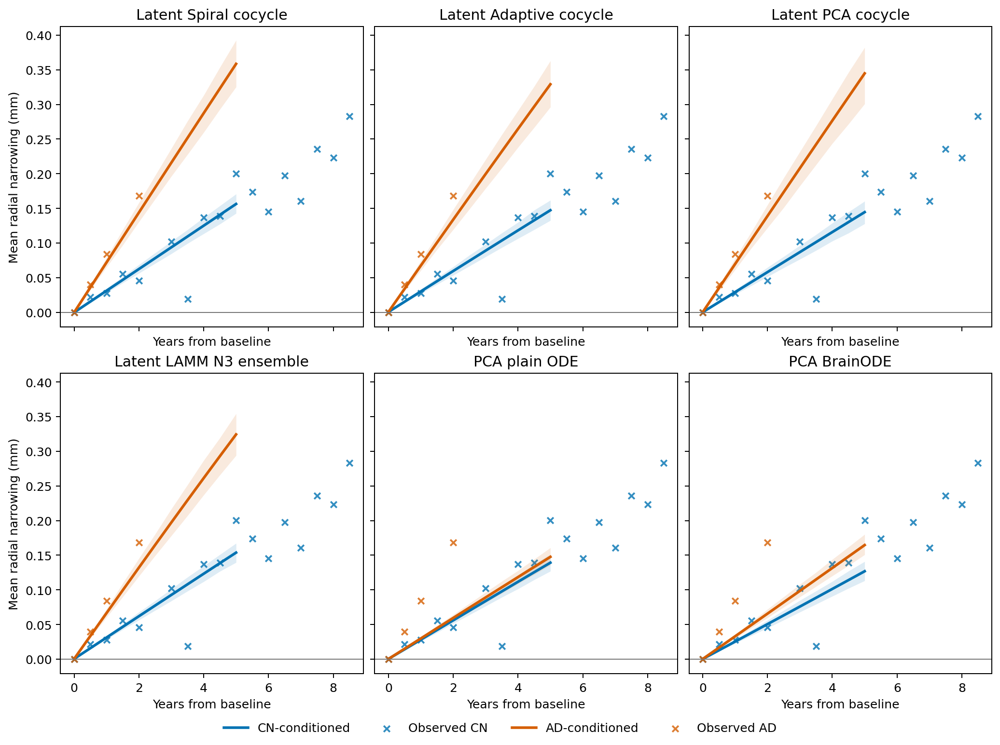

In [31]:
figure("surface_radial_narrowing_progression_without_direct_mesh.png")


For each mesh, the third figure calculates `100 log(A_u/A_0) - (2/3) 100 log(V_u/V_0)`. The subtraction removes the area change expected under uniform 3-D scaling. Lines and bands use the same 51 × 2 × 11 predictions and 2,000 subject bootstraps; crosses use actual repeated meshes. Zero indicates uniform scaling, not absence of all deformation.


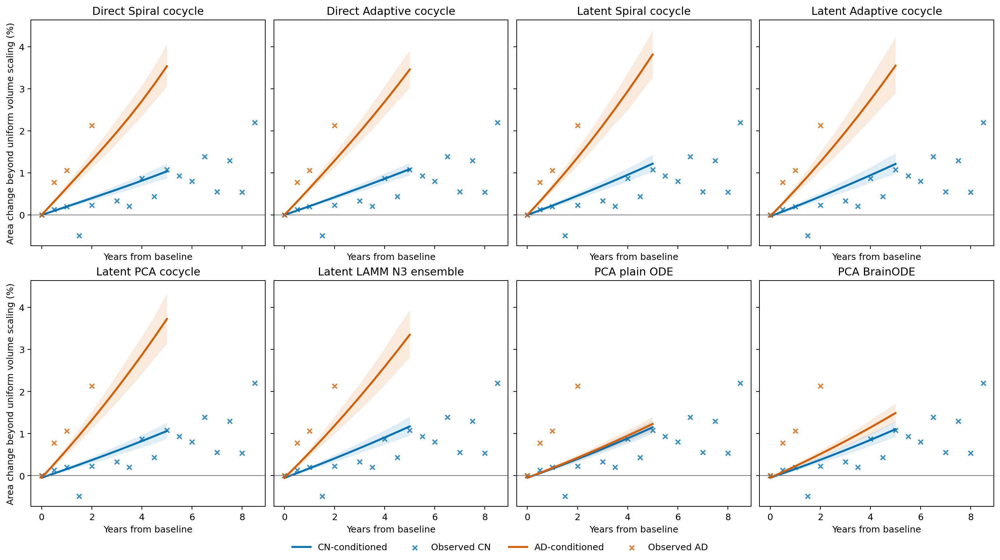

In [32]:
figure("surface_nonuniform_area_progression.png")


### Companion non-uniform area trajectories without direct mesh methods

The companion applies the same area-versus-volume equation and displays the same latent/ODE predictions and observed crosses. Only the two direct panels are absent; zero still means that surface area changed exactly as expected under uniform volumetric scaling.


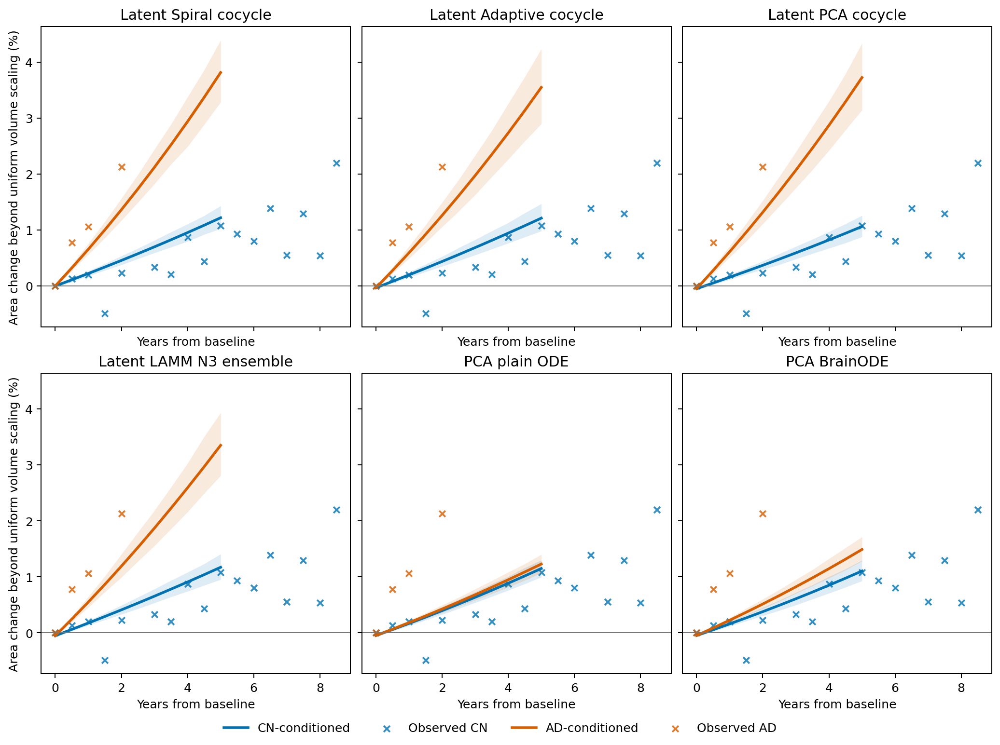

In [33]:
figure("surface_nonuniform_area_progression_without_direct_mesh.png")


### 6.7 Spatial map of disease-associated instantaneous change

Each method begins with 269 per-vertex inward fields. Visits are averaged within each subject, producing 33 CN fields and 28 AD fields; group means are then subtracted as `mean_AD(q_i)-mean_CN(q_i)`. The observed panel applies the identical calculation to the fitted repeat-scan reference. Face colors are averages of their three corresponding vertices and all nine panels share one color scale. Red indicates greater inward motion in AD; blue indicates less. The flattened view is only a consistent visualization of the template mesh—it does not change the 3-D velocity calculation.


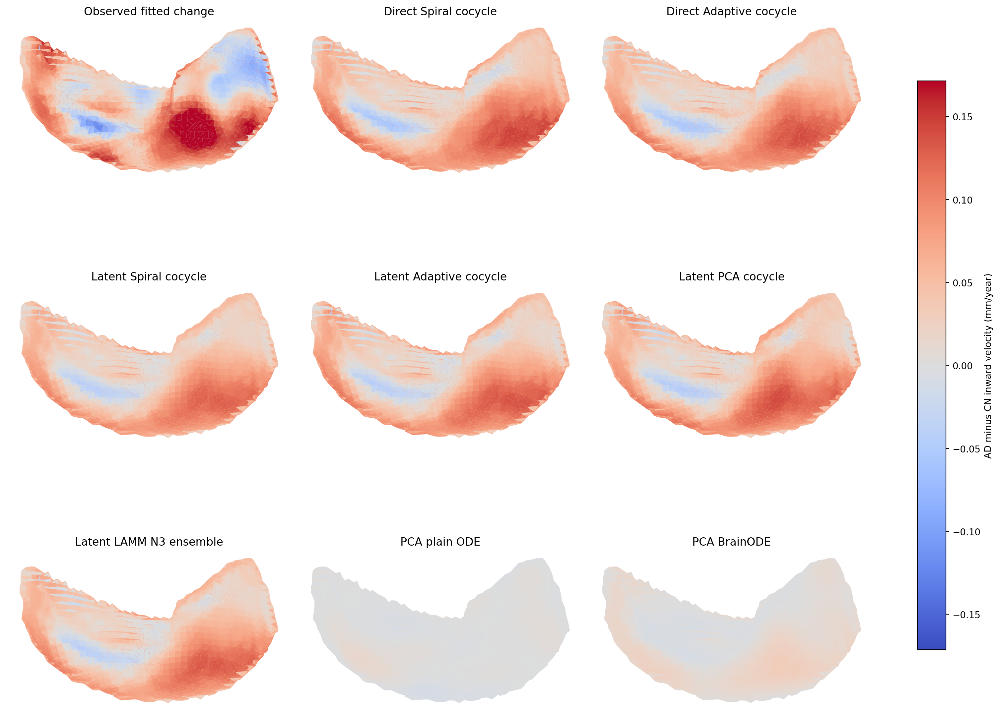

In [34]:
figure("velocity_ad_minus_cn_surface_map.png", width=1250)


### Companion spatial velocity map without direct mesh methods

This map keeps the fitted-observed panel and six non-direct method panels. Direct Spiral and Direct Adaptive are omitted before layout, while per-subject averaging, AD-minus-CN subtraction, template projection, and the shared color scale are recomputed with the same definitions as the original.


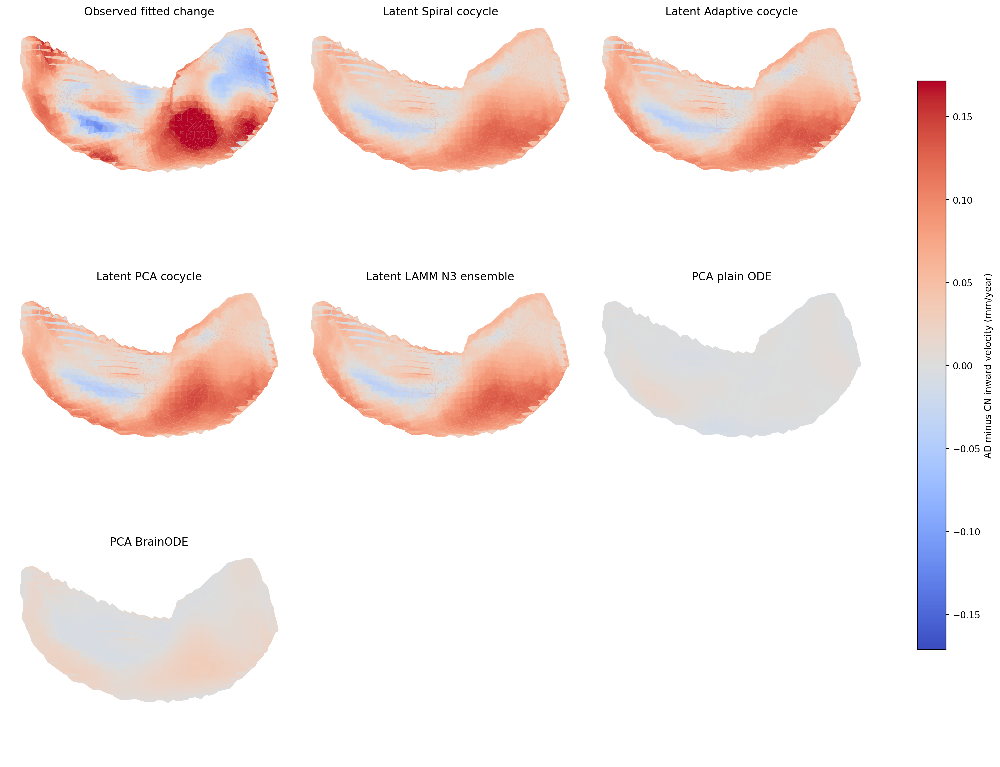

In [35]:
figure("velocity_ad_minus_cn_surface_map_without_direct_mesh.png", width=1250)


## 7. Matched PCA ODE and PCA BrainODE endpoint baselines

The completed PCA plain ODE and PCA BrainODE use the exact same fixed PCA archive, visit order, train-only standardization, disease condition, and subject split as the PCA cocycle. PCA plain ODE learns a diagnosis-conditioned MLP vector field `dz/dt=f(z,t,d)` and integrates it with fixed-step RK4. PCA BrainODE supplies the vector field through singleton Q/K/V attention, so one subject's derivative does not depend on unrelated cases in a batch. Both decode surface velocity as `J_D(z)f(z,t,d)`.

The next table uses the same **20 strict test subjects (13 CN, 7 AD)** and one first-to-last prediction per subject described in Section 3. It displays only the overall 20-subject endpoint summaries for latent PCA cocycle, PCA Plain ODE, and PCA BrainODE. Their instantaneous results already appear in every 269-scan validation analysis in Section 6.


In [36]:
table(
    "prediction_metrics_strict_test.csv",
    ["method_label", "diagnosis", "subjects", "mean_vertex_error_mm", "assd_mm", "hd95_mm", "volume_relative_error", "volume_rate_abs_error_per_year"],
    'diagnosis == "overall" and method in ["pca128", "pca_plain_ode", "pca_brainode"]',
)


,method_label,diagnosis,subjects,mean_vertex_error_mm,assd_mm,hd95_mm,volume_relative_error,volume_rate_abs_error_per_year
0,Latent PCA,overall,20,0.306314,0.203187,0.514887,0.036528,0.014574
1,PCA BrainODE,overall,20,0.318376,0.210673,0.529242,0.039613,0.017625
2,PCA plain ODE,overall,20,0.313006,0.207487,0.530419,0.043522,0.017827


,method_label,diagnosis,subjects,mean_vertex_error_mm,assd_mm,hd95_mm,volume_relative_error,volume_rate_abs_error_per_year
2,Latent PCA,overall,20,0.306314,0.203187,0.514887,0.036528,0.014574
35,PCA BrainODE,overall,20,0.318376,0.210673,0.529242,0.039613,0.017625
38,PCA plain ODE,overall,20,0.313006,0.207487,0.530419,0.043522,0.017827


## 8. Composition and inverse consistency

For source, intermediate, and target ages `s,m,t`, composition defect is the normalized discrepancy

`||Phi(Phi(X,s,m,d),m,t,d)-Phi(X,s,t,d)|| / ||Phi(X,s,t,d)-X||`.

Inverse defect is

`||Phi(Phi(X,s,t,d),t,s,d)-X|| / ||Phi(X,s,t,d)-X||`.

The CSV records mean and 95th percentile together with the evaluation split. For ODE baselines, composition measures the numerical semigroup defect of repeated fixed-step RK4 integration. The cell displays all non-LAMM entries available in this consistency table; the excluded LAMM ablations remain in the raw file. Lower is better, but a consistently wrong biological field can still satisfy these algebraic identities.


In [37]:
consistency = pd.read_csv(TABLES / "cocycle_consistency.csv")
display(consistency.loc[~consistency.method.astype(str).isin(NONSELECTED_LAMM)].reset_index(drop=True))


,method,method_label,relative_cocycle_defect_mean,relative_cocycle_defect_p95,relative_inverse_defect_mean,relative_inverse_defect_p95,split
0,adaptive_spiral_mesh_direct,Direct Adaptive,2.211432e-03,8.701153e-03,8.611189e-03,3.398521e-02,val
1,spiral_mesh_direct,Direct Spiral,3.428339e-03,9.818652e-03,9.796513e-03,3.533065e-02,val
2,adaptive_spiral_mesh_direct,Direct Adaptive,3.037264e-03,1.144275e-02,1.060842e-02,4.235905e-02,test
3,spiral_mesh_direct,Direct Spiral,6.041029e-03,2.427745e-02,1.164811e-02,4.000768e-02,test
4,pca_plain_ode,PCA plain ODE,1.364731e-07,1.936668e-07,3.558740e-08,6.938124e-08,val
5,pca_plain_ode,PCA plain ODE,1.446859e-07,2.064174e-07,3.696318e-08,7.347168e-08,test
6,pca_brainode,PCA BrainODE,1.325344e-07,1.865929e-07,3.259081e-08,6.720259e-08,val
7,pca_brainode,PCA BrainODE,1.978154e-07,4.674827e-07,5.535041e-08,1.390087e-07,test


## 9. Existing paper-core PCA BrainODE comparison

This is the separate PCA-150 paper-core BrainODE used by the existing age-105 mesh comparison. It is an ODE in raw PCA coordinates with one-subject attention semantics and fixed-step integration. The first displayed table contains two selected observed intervals—one CN subject and one AD subject—with one BrainODE and one PCA-cocycle prediction for each, giving four rows. The second table is a broader volume-slope summary: all 597 subjects, plus train/validation/test subsets, split by CN/AD and method. The `subjects` column states every denominator (for example, validation has 33 CN and 28 AD subjects).

These results retain the paper-core protocol and should not be merged numerically with the matched PCA BrainODE experiment above. The code cell only loads the two saved tables.


In [38]:
table("brainode_selected_mesh_metrics.csv")
table("brainode_cohort_volume_trend_summary.csv")


,diagnosis,subject_id,gap_years,model,model_label,vertex_error_mean,normal_change_mae,normal_change_pearson,hotspot_dice
0,CN,31,10.255989,brainode,paper-core BrainODE,0.282737,0.018570,0.331412,0.183636
1,CN,31,10.255989,cocycle_flow,PCA Cocycle Flow,0.344557,0.022926,0.383217,0.300000
2,AD,995,2.992470,brainode,paper-core BrainODE,0.346672,0.077935,0.521541,0.374545
3,AD,995,2.992470,cocycle_flow,PCA Cocycle Flow,0.336861,0.080375,0.418377,0.372727


,split,diagnosis,model,model_label,subjects,observed_slope_mean,predicted_slope_mean,slope_absolute_error_mean,slope_pearson,observed_mm3_per_year_mean,predicted_mm3_per_year_mean
0,all,AD,brainode,paper-core BrainODE,271,-0.042087,-0.030337,0.027074,0.280513,-124.973513,-89.402241
1,all,AD,cocycle_flow,PCA Cocycle Flow,271,-0.042087,-0.041931,0.011925,0.803164,-124.973513,-124.924996
2,all,CN,brainode,paper-core BrainODE,326,-0.011721,-0.013143,0.008890,0.320293,-44.200627,-49.860320
3,all,CN,cocycle_flow,PCA Cocycle Flow,326,-0.011721,-0.012434,0.007053,0.603717,-44.200627,-47.164649
4,test,AD,brainode,paper-core BrainODE,28,-0.052695,-0.028941,0.038372,-0.198309,-157.400283,-84.144060
5,test,AD,cocycle_flow,PCA Cocycle Flow,28,-0.052695,-0.039737,0.034055,-0.087763,-157.400283,-116.880384
6,test,CN,brainode,paper-core BrainODE,33,-0.010244,-0.014975,0.010498,-0.092954,-40.195943,-54.779298
7,test,CN,cocycle_flow,PCA Cocycle Flow,33,-0.010244,-0.011660,0.009008,-0.074582,-40.195943,-43.958000
8,train,AD,brainode,paper-core BrainODE,215,-0.040309,-0.030635,0.026215,0.362720,-120.104954,-90.851427
9,train,AD,cocycle_flow,PCA Cocycle Flow,215,-0.040309,-0.042170,0.008322,0.931114,-120.104954,-126.211501


,split,diagnosis,model,model_label,subjects,observed_slope_mean,predicted_slope_mean,slope_absolute_error_mean,slope_pearson,observed_mm3_per_year_mean,predicted_mm3_per_year_mean
0,all,AD,brainode,paper-core BrainODE,271,-0.042087,-0.030337,0.027074,0.280513,-124.973513,-89.402241
1,all,AD,cocycle_flow,PCA Cocycle Flow,271,-0.042087,-0.041931,0.011925,0.803164,-124.973513,-124.924996
2,all,CN,brainode,paper-core BrainODE,326,-0.011721,-0.013143,0.008890,0.320293,-44.200627,-49.860320
3,all,CN,cocycle_flow,PCA Cocycle Flow,326,-0.011721,-0.012434,0.007053,0.603717,-44.200627,-47.164649
4,test,AD,brainode,paper-core BrainODE,28,-0.052695,-0.028941,0.038372,-0.198309,-157.400283,-84.144060
5,test,AD,cocycle_flow,PCA Cocycle Flow,28,-0.052695,-0.039737,0.034055,-0.087763,-157.400283,-116.880384
6,test,CN,brainode,paper-core BrainODE,33,-0.010244,-0.014975,0.010498,-0.092954,-40.195943,-54.779298
7,test,CN,cocycle_flow,PCA Cocycle Flow,33,-0.010244,-0.011660,0.009008,-0.074582,-40.195943,-43.958000
8,train,AD,brainode,paper-core BrainODE,215,-0.040309,-0.030635,0.026215,0.362720,-120.104954,-90.851427
9,train,AD,cocycle_flow,PCA Cocycle Flow,215,-0.040309,-0.042170,0.008322,0.931114,-120.104954,-126.211501


## 10. Observed future, prediction-only future, and age-105 stress test

This experiment uses one held-out AD subject (ID 995) whose source scan is at age 78.5. The grid contains **10 ages**. Five ages have an actual mesh (source plus four repeat scans), five are prediction-only, and the age-100 and age-105 points are outside training-age support. Both methods therefore make 10 geometric evaluations, but prediction error is computable only at the five observed ages.

Direct Adaptive was selected using validation data in Section 4. Its composed result applies the learned cocycle in annual steps plus a final remainder; its one-shot result goes directly from age 78.5 to the target age. BrainODE integrates its vector field from the same source. The table reports volumes, one-shot/composed disagreement, mesh error where observed surfaces exist, topology/edge checks, and explicit OOD flags.

The volume curve is a structural diagnostic. Smooth monotonic volume does not prove anatomical validity; abrupt collapse, face inversion, extreme edge distortion, or one-shot/composition divergence is evidence against a trustworthy extrapolation. The structural guardrail requires volume/source in 0.1–1.5, face flips at most 0.1%, no degenerate faces, central edge ratios within 0.2–5, and maximum displacement at most 30 mm. A failed guardrail is a direct warning not to interpret that age's mesh anatomically.


In [39]:
ood = table(
    "ood_best_vs_brainode_trajectory.csv",
    ["target_age_years", "observed_mesh_available", "observed_volume_mm3", "best_composed_volume_mm3", "brainode_volume_mm3", "best_mean_vertex_error_mm", "brainode_mean_vertex_error_mm", "one_shot_vs_composed_mean_vertex_mm", "best_volume_ratio", "best_flipped_face_fraction", "best_structural_guardrail_pass", "brainode_volume_ratio", "brainode_flipped_face_fraction", "brainode_structural_guardrail_pass", "out_of_distribution"],
)
for label, column in (("Selected cocycle", "best_structural_guardrail_pass"), ("BrainODE", "brainode_structural_guardrail_pass")):
    failed = ood.loc[~ood[column].astype(bool), "target_age_years"]
    display(HTML(f"<b>{label} first structural-guardrail failure:</b> " + (f"age {failed.min():.2f}" if len(failed) else "none on this grid")))


,target_age_years,observed_mesh_available,observed_volume_mm3,best_composed_volume_mm3,brainode_volume_mm3,best_mean_vertex_error_mm,brainode_mean_vertex_error_mm,one_shot_vs_composed_mean_vertex_mm,best_volume_ratio,best_flipped_face_fraction,best_structural_guardrail_pass,brainode_volume_ratio,brainode_flipped_face_fraction,brainode_structural_guardrail_pass,out_of_distribution
0,78.500000,True,2921.890511,2921.890511,2924.063702,0.000000,0.038438,0.000000e+00,1.000000,0.000000,True,1.000744,0.000000,True,False
1,78.984596,True,2701.930621,2862.566513,2867.078965,0.254233,0.253396,3.409875e-09,0.979697,0.000000,True,0.981241,0.000000,True,False
2,79.515739,True,2478.643993,2798.371452,2804.155290,0.472128,0.469696,3.573469e-05,0.957726,0.000000,True,0.959706,0.000000,True,False
3,80.734085,True,2474.868909,2652.036615,2657.787865,0.353693,0.338019,3.476793e-03,0.907644,0.000000,True,0.909612,0.000000,True,False
4,81.492470,True,2424.585947,2562.217662,2565.014737,0.373826,0.349005,7.221782e-03,0.876904,0.000000,True,0.877861,0.000000,True,False
5,85.000000,False,NaN,2151.071708,2114.590154,NaN,NaN,4.771607e-02,0.736192,0.000000,True,0.723706,0.000000,True,False
6,90.000000,False,NaN,1636.286982,1395.052667,NaN,NaN,1.621900e-01,0.560010,0.000000,True,0.477449,0.000000,True,False
7,95.000000,False,NaN,1180.346903,617.950818,NaN,NaN,2.854697e-01,0.403967,0.002733,False,0.211490,0.023324,False,False
8,100.000000,False,NaN,771.140744,96.425604,NaN,NaN,4.692773e-01,0.263918,0.010022,False,0.033001,0.241618,False,True
9,105.000000,False,NaN,413.929948,560.424733,NaN,NaN,6.875473e-01,0.141665,0.025328,False,0.191802,0.466108,False,True


The volume graph is constructed from the same 10 table rows. Solid method lines connect predicted volumes at the discrete target ages; observed markers appear only at the five ages with actual scans. No smoother is fitted. The vertical dashed line marks the end of training-age support, so the two points at ages 100 and 105 are extrapolations rather than ground-truth comparisons.


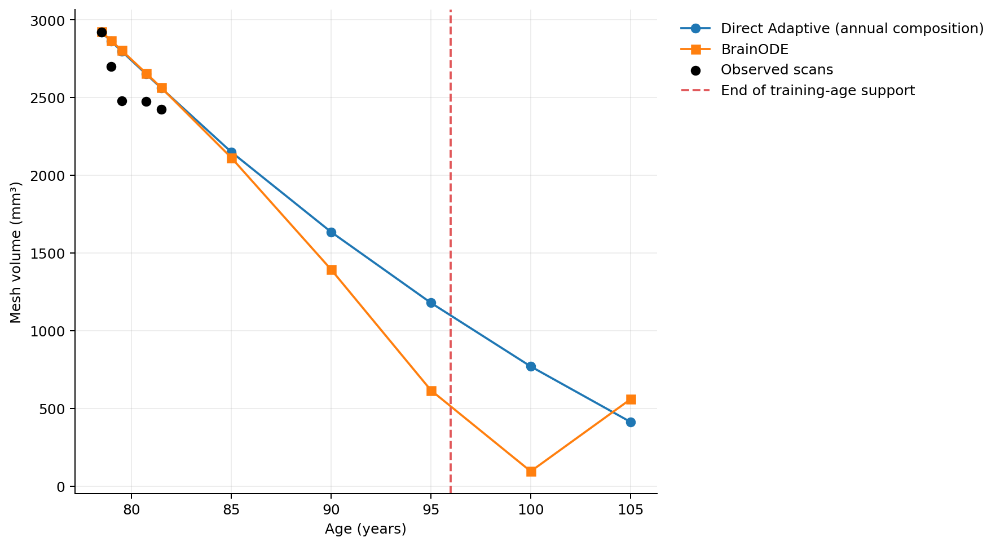

In [40]:
figure("ood_best_vs_brainode_volume.png")


### Companion OOD volume view without direct mesh methods

Because the validation-selected cocycle in the original is Direct Adaptive, omitting both direct methods leaves no selected cocycle curve. This companion therefore shows only the same five observed volume markers, the ten BrainODE predictions, and the age-96 support boundary. It is a baseline-only view, not a replacement latent-cocycle selection experiment.


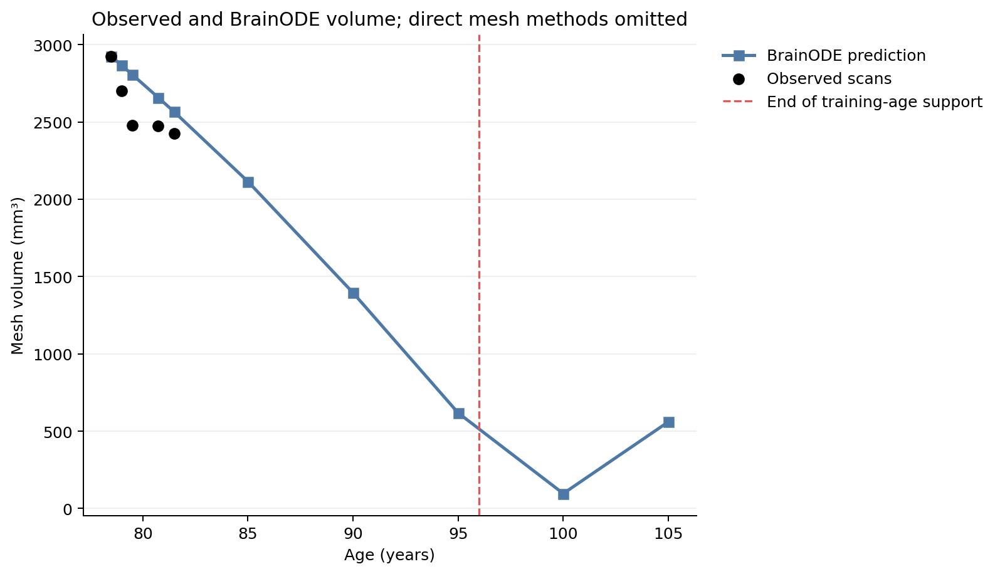

In [41]:
figure("ood_brainode_only_volume_without_direct_mesh.png")


The HTML slider loads the same 10 ages and shows exactly three synchronized panels: observed, selected cocycle, and BrainODE. Vertex color is displacement magnitude from the age-78.5 source in millimetres, with a common scale at each age. At the five prediction-only ages the observed panel is intentionally faint; no synthetic surface is presented as ground truth. The code cell embeds the already-generated HTML and supplies a separate-tab link—it does not rerun either model.


In [42]:
html_path = EXPERIMENT_DIR / "html" / "best_cocycle_vs_brainode_ad_age105.html"
display(IFrame(src=html_path.as_uri(), width="100%", height=700))
display(HTML(f'<p><a href="{html_path.as_uri()}" target="_blank">Open the interactive comparison in a separate tab</a></p>'))


## 11. Interpretation checklist

1. First check representation reconstruction; it sets a latent model's attainable surface floor.
2. Then compare endpoint ASSD/HD95 and corresponding-vertex distance against the unchanged-source baseline.
3. Check whether predicted AD/CN log-volume rates match observed magnitude, not only sign.
4. Treat diagonal velocity as a separate dynamic test. Endpoint accuracy can be good even when the local field is too slow or spatially misdirected.
5. Use cocycle/inverse defects as algebraic diagnostics, not proof of biological truth.
6. Treat ages beyond the observed/training range as hypothesis generation only. Structural validity and smoothness are necessary but not sufficient.
